In [ ]:
!wget http://webia.lip6.fr/~dancette/deep-learning/assets/TP3-4/TP3-4.zip
!unzip -j TP3-4.zip

--2020-11-05 16:04:10--  http://webia.lip6.fr/~dancette/deep-learning/assets/TP3-4/TP3-4.zip
Resolving webia.lip6.fr (webia.lip6.fr)... 132.227.201.33
Connecting to webia.lip6.fr (webia.lip6.fr)|132.227.201.33|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13421167 (13M) [application/zip]
Saving to: ‘TP3-4.zip’

TP3-4.zip           100%[===================>]  12.80M  12.6MB/s    in 1.0s    

2020-11-05 16:04:11 (12.6 MB/s) - ‘TP3-4.zip’ saved [13421167/13421167]

Archive:  TP3-4.zip
  inflating: tme5.py                 
  inflating: mnist.mat               
  inflating: circles.py              
  inflating: circles.mat             


In [ ]:
import math
import torch
from torch.autograd import Variable
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%run 'tme5.py'

# Partie 1 : Forward et Backward manuels

In [ ]:
def init_params(nx, nh, ny):
    """
    nx, nh, ny: integers
    out params: dictionnary
    """
    params = {}
    
    #####################
    ## Votre code ici  ##
    #####################
    # remplir avec les paramètres Wh, Wy, bh, by
    
    params["Wh"] = torch.randn(nh, nx)
    params["Wy"] = torch.randn(ny, nh)
    params["bh"] = torch.zeros(nh, 1)
    params["by"] = torch.zeros(ny, 1)
    
    ####################
    ##      FIN        #
    ####################
    return params

In [ ]:
def forward(params, X):
    """
    params: dictionnary
    X: (n_batch, dimension)
    """
    bsize = X.size(0)
    nh = params['Wh'].size(0)
    ny = params['Wy'].size(0)
    outputs = {}

    #####################
    ## Votre code ici  ##
    #####################
    # remplir avec les paramètres X, htilde, h, ytilde, yhat
    
    outputs["X"] = X
    outputs["htilde"] = torch.mm(X, params['Wh'].t()) + params['bh'].t().expand(bsize, nh)
    outputs["h"] = torch.tanh(outputs['htilde'])
    outputs["ytilde"] = torch.mm(outputs["h"], params["Wy"].t()) + params["by"].t().expand(bsize, ny) #logits
    outputs["yhat"] = torch.exp(outputs['ytilde'])
    outputs["yhat"] = outputs['yhat'] / outputs['yhat'].sum(1, keepdim=True).expand_as(outputs['yhat'])
    
    ####################
    ##      FIN        #
    ####################

    return outputs['yhat'], outputs

In [ ]:
def loss_accuracy(Yhat, Y):

    #####################
    ## Votre code ici  ##
    #####################

    L = -1 * torch.mean((Y * torch.log(Yhat)).sum(dim=1))
    _, indYhat = torch.max(Yhat,1)
    _, indY = torch.max(Y, 1)
    acc = torch.sum(indY == indYhat) * 100. / indY.size(0)

    ####################
    ##      FIN        #
    ####################

    return L, acc

In [ ]:
def backward(params, outputs, Y):
    bsize = Y.shape[0]
    grads = {}

    #####################
    ## Votre code ici  ##
    #####################
    # remplir avec les paramètres Wy, Wh, by, bh
    deltay = outputs["yhat"] - Y
    grads["Wy"] = torch.mm(deltay.t(), outputs["h"])
    grads["by"] = deltay.sum(0, keepdim=True).t()
    deltah = torch.mm(deltay,params["Wy"]) * (1-torch.pow(outputs["h"],2))
    grads["Wh"] = torch.mm(deltah.t(), outputs["X"])
    grads["bh"] = deltah.sum(0, keepdim=True).t()

    grads["Wy"] /= bsize
    grads["by"] /= bsize
    grads["Wh"] /= bsize
    grads["bh"] /= bsize
    

    ####################
    ##      FIN        #
    ####################
    return grads

In [ ]:
def sgd(params, grads, eta):

    #####################
    ## Votre code ici  ##
    #####################
    # mettre à jour le contenu de params

    params["Wh"] = params["Wh"] - eta * grads["Wh"]
    params["Wy"] = params["Wy"] - eta * grads["Wy"]
    params["bh"] = params["bh"] - eta * grads["bh"]
    params["by"] = params["by"] - eta * grads["by"]    

    ####################
    ##      FIN        #
    ####################
    return params

## Algorithme global d'apprentissage (manuel)

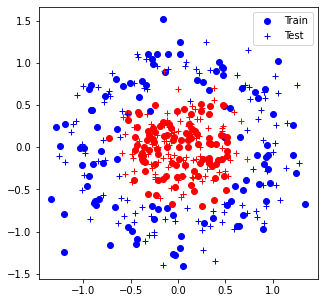

Ltrain tensor(0.9613)


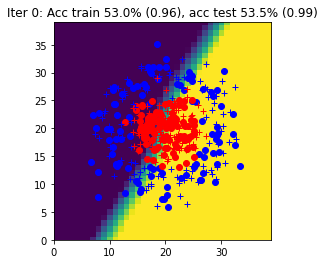

Ltrain tensor(0.7684)


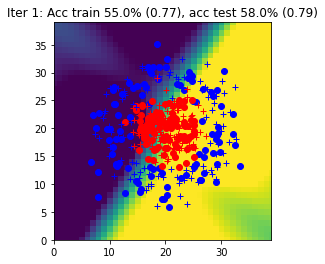

Ltrain tensor(0.6783)


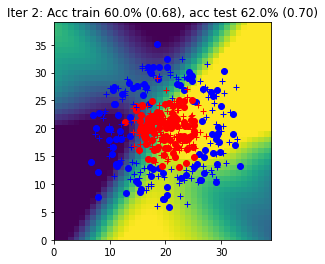

Ltrain tensor(0.6385)


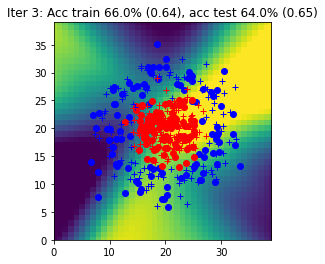

Ltrain tensor(0.6197)


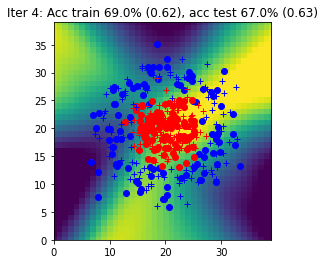

Ltrain tensor(0.6071)


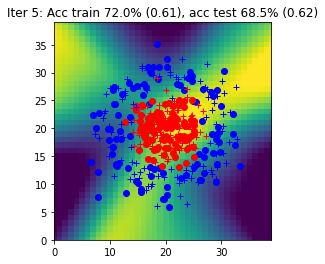

Ltrain tensor(0.5967)


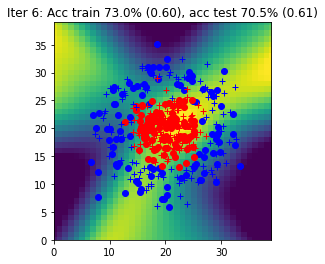

Ltrain tensor(0.5870)


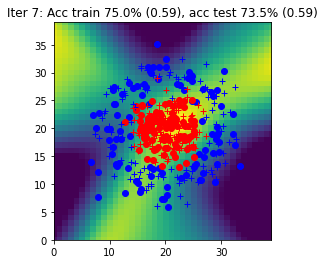

Ltrain tensor(0.5779)


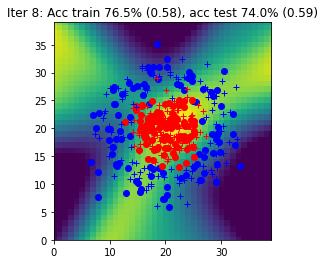

Ltrain tensor(0.5692)


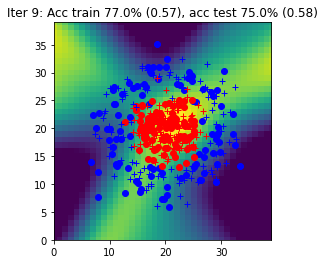

Ltrain tensor(0.5607)


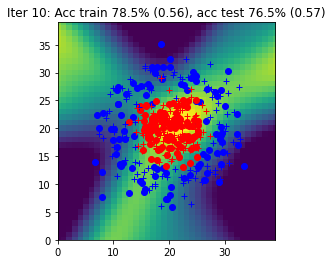

Ltrain tensor(0.5523)


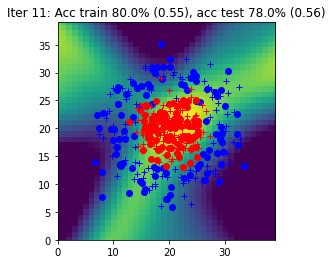

Ltrain tensor(0.5441)


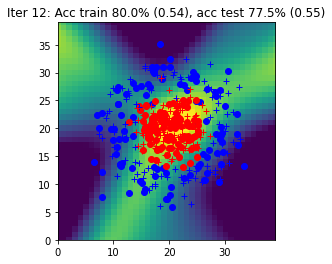

Ltrain tensor(0.5361)


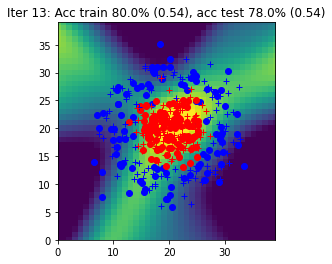

Ltrain tensor(0.5283)


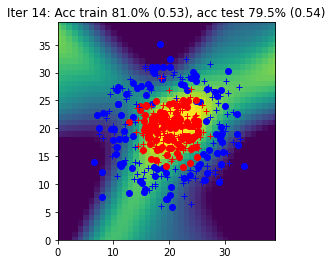

Ltrain tensor(0.5207)


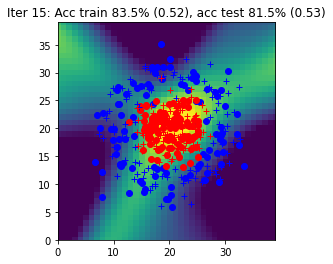

Ltrain tensor(0.5130)


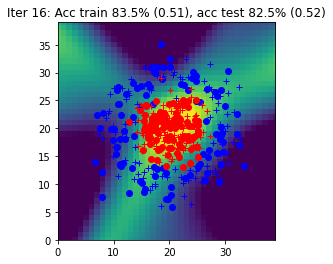

Ltrain tensor(0.5053)


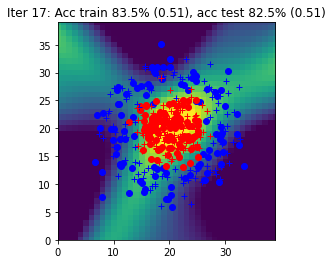

Ltrain tensor(0.4981)


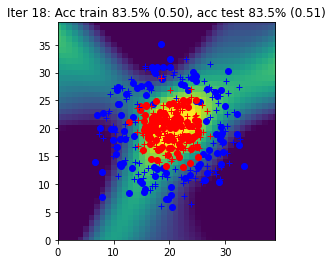

Ltrain tensor(0.4906)


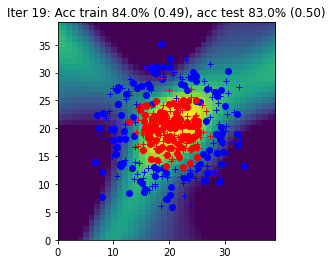

Ltrain tensor(0.4835)


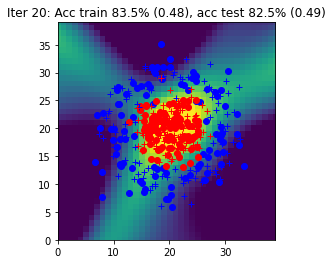

Ltrain tensor(0.4764)


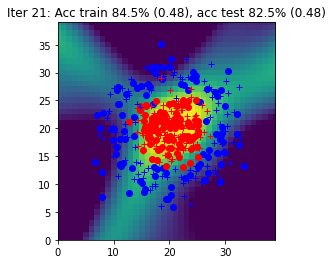

Ltrain tensor(0.4694)


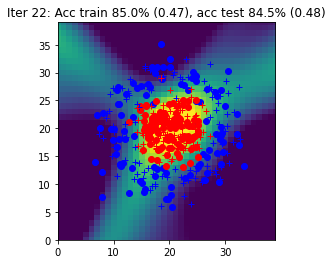

Ltrain tensor(0.4626)


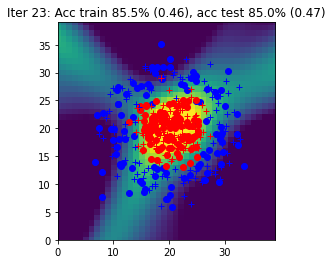

Ltrain tensor(0.4559)


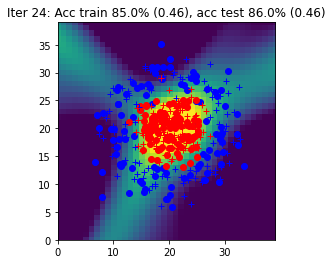

Ltrain tensor(0.4494)


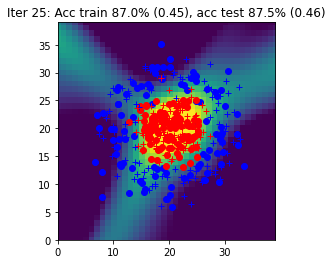

Ltrain tensor(0.4428)


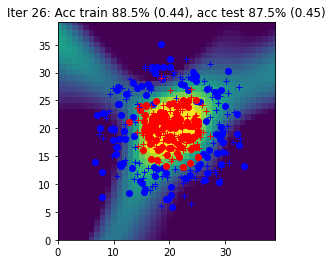

Ltrain tensor(0.4365)


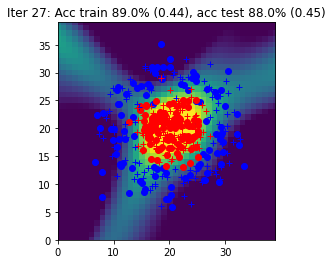

Ltrain tensor(0.4304)


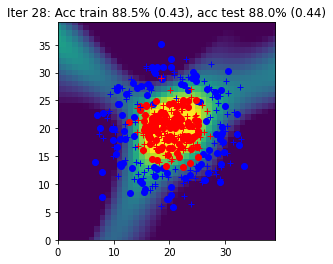

Ltrain tensor(0.4243)


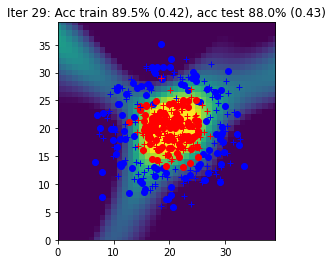

Ltrain tensor(0.4184)


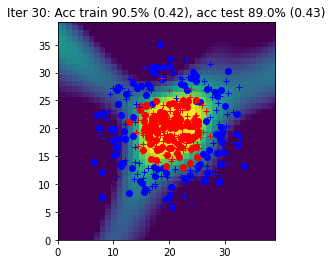

Ltrain tensor(0.4126)


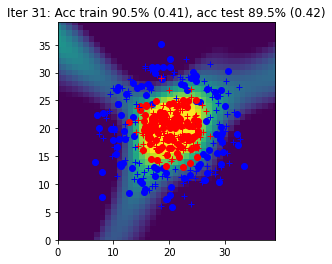

Ltrain tensor(0.4069)


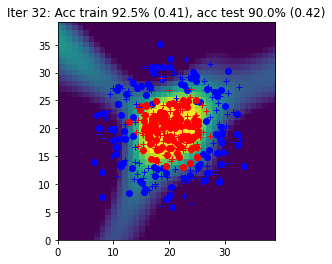

Ltrain tensor(0.4014)


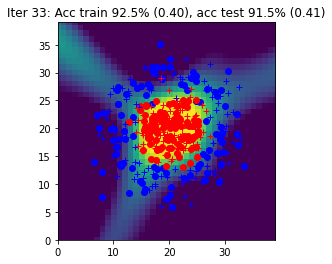

Ltrain tensor(0.3960)


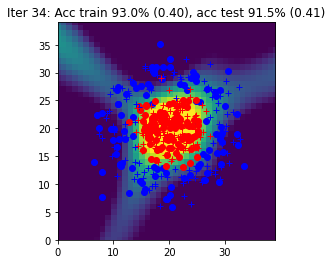

Ltrain tensor(0.3907)


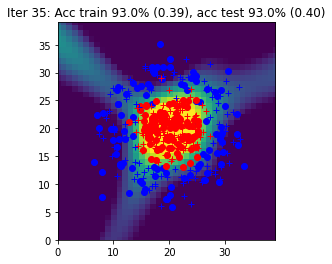

Ltrain tensor(0.3856)


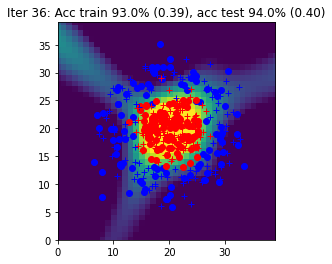

Ltrain tensor(0.3806)


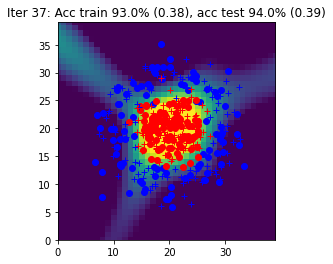

Ltrain tensor(0.3758)


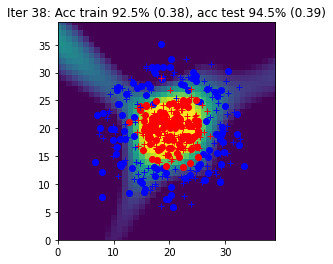

Ltrain tensor(0.3711)


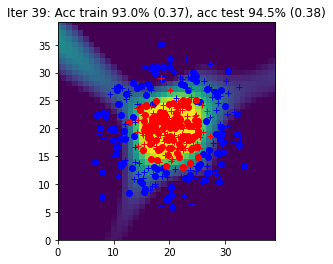

Ltrain tensor(0.3663)


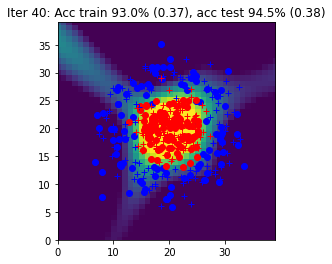

Ltrain tensor(0.3618)


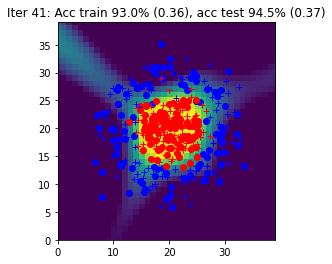

Ltrain tensor(0.3576)


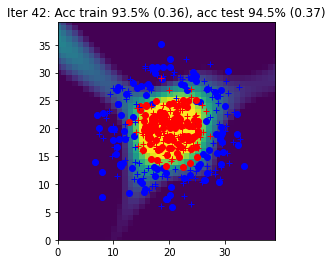

Ltrain tensor(0.3532)


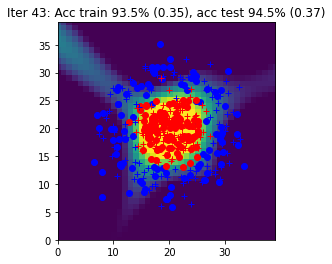

Ltrain tensor(0.3490)


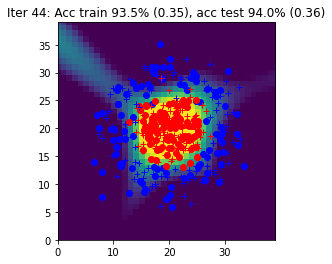

Ltrain tensor(0.3449)


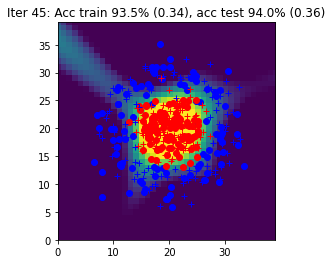

Ltrain tensor(0.3409)


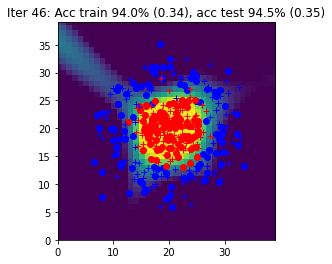

Ltrain tensor(0.3371)


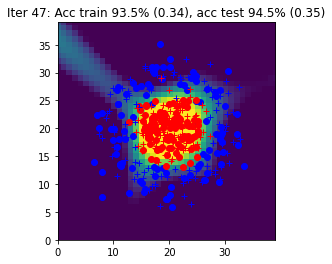

Ltrain tensor(0.3334)


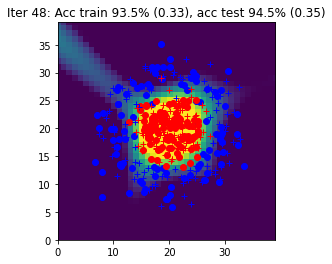

Ltrain tensor(0.3296)


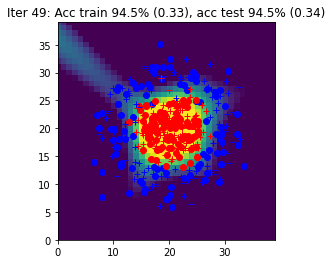

Ltrain tensor(0.3260)


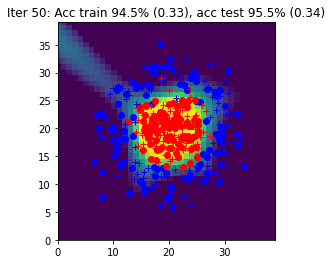

Ltrain tensor(0.3225)


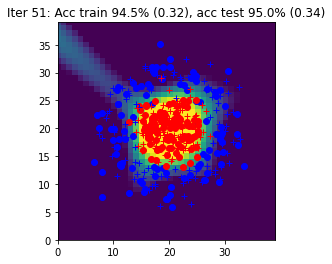

Ltrain tensor(0.3191)


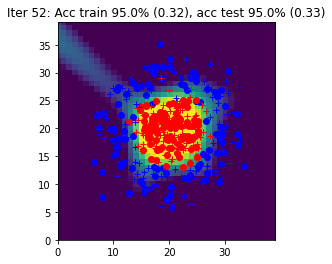

Ltrain tensor(0.3158)


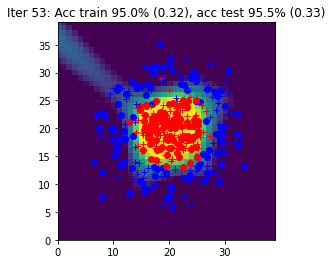

Ltrain tensor(0.3126)


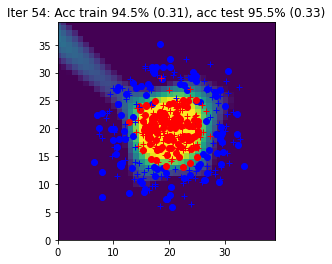

Ltrain tensor(0.3094)


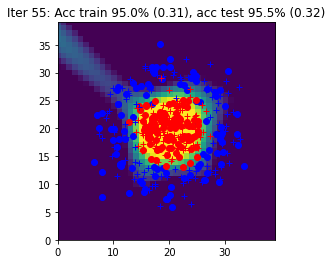

Ltrain tensor(0.3062)


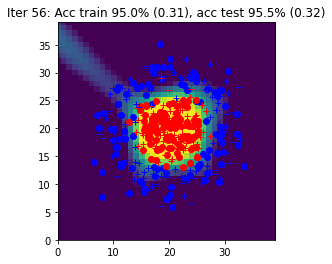

Ltrain tensor(0.3032)


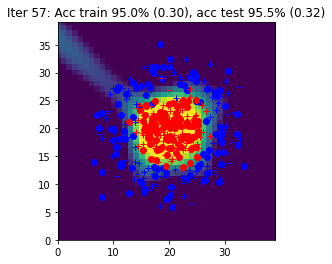

Ltrain tensor(0.3003)


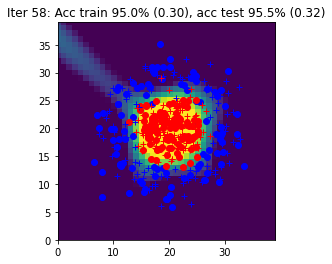

Ltrain tensor(0.2974)


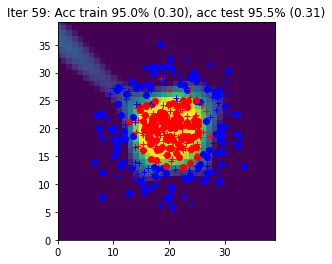

Ltrain tensor(0.2946)


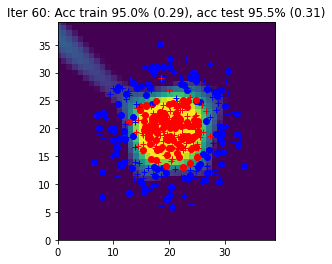

Ltrain tensor(0.2918)


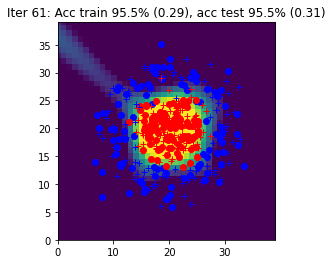

Ltrain tensor(0.2891)


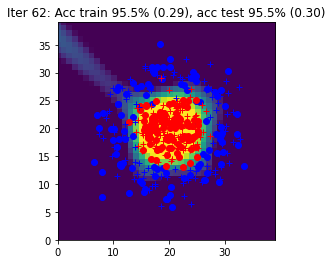

Ltrain tensor(0.2864)


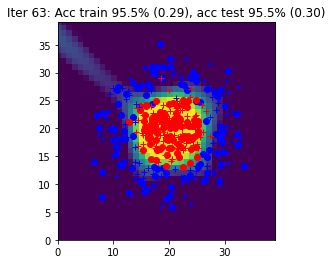

Ltrain tensor(0.2838)


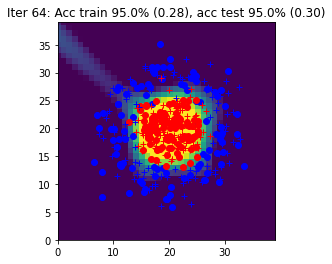

Ltrain tensor(0.2813)


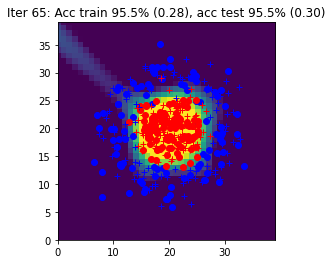

Ltrain tensor(0.2789)


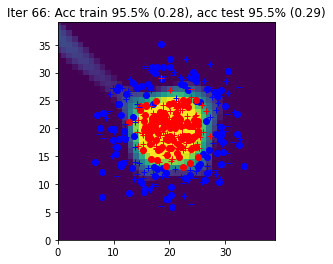

Ltrain tensor(0.2765)


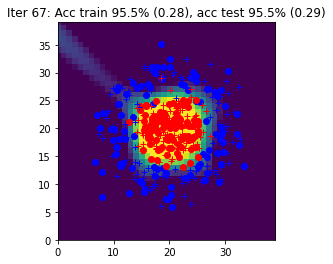

Ltrain tensor(0.2741)


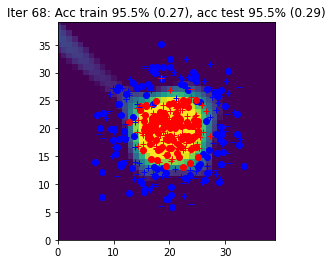

Ltrain tensor(0.2718)


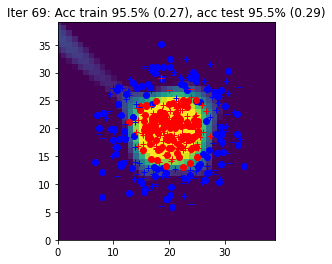

Ltrain tensor(0.2696)


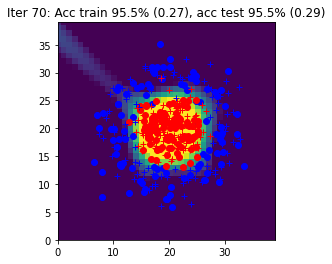

Ltrain tensor(0.2674)


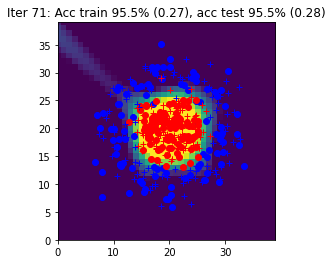

Ltrain tensor(0.2654)


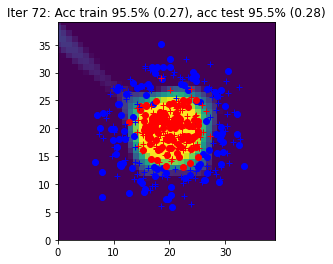

Ltrain tensor(0.2632)


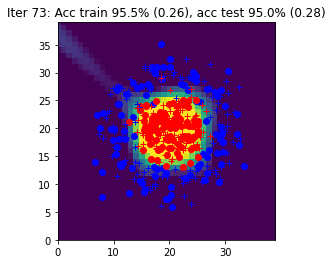

Ltrain tensor(0.2612)


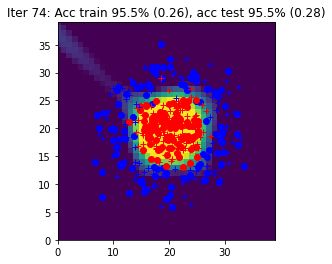

Ltrain tensor(0.2590)


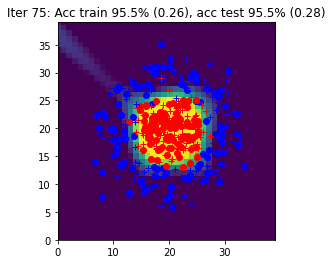

Ltrain tensor(0.2571)


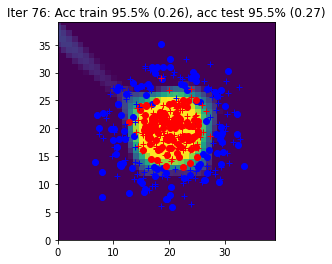

Ltrain tensor(0.2551)


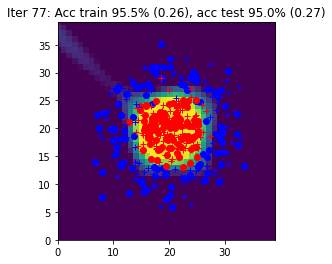

Ltrain tensor(0.2532)


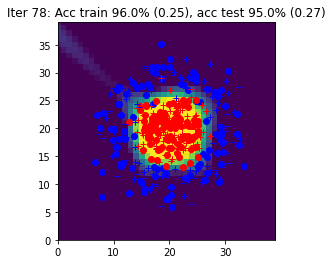

Ltrain tensor(0.2514)


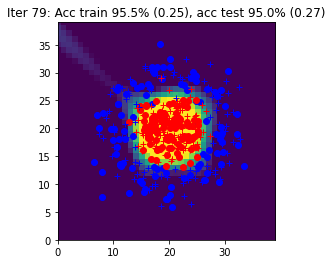

Ltrain tensor(0.2496)


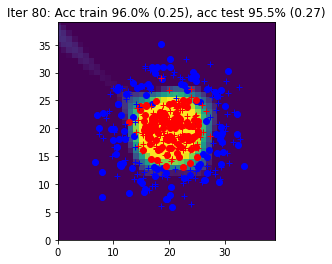

Ltrain tensor(0.2477)


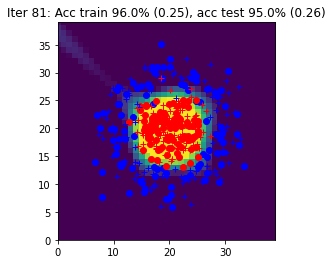

Ltrain tensor(0.2460)


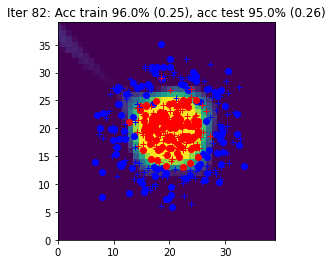

Ltrain tensor(0.2443)


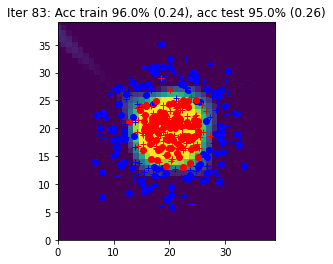

Ltrain tensor(0.2426)


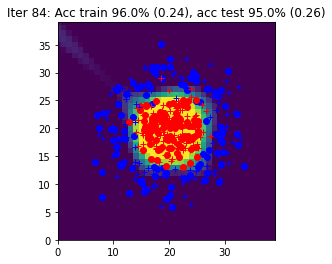

Ltrain tensor(0.2409)


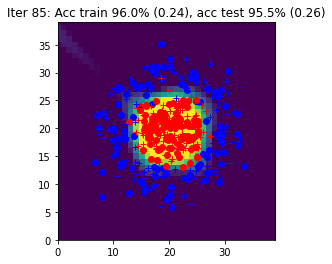

Ltrain tensor(0.2394)


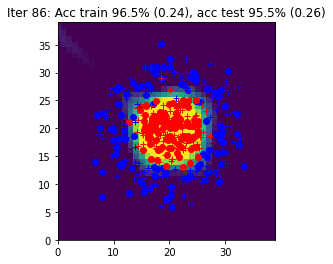

Ltrain tensor(0.2377)


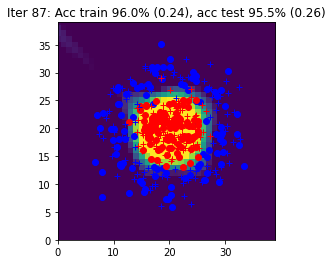

Ltrain tensor(0.2362)


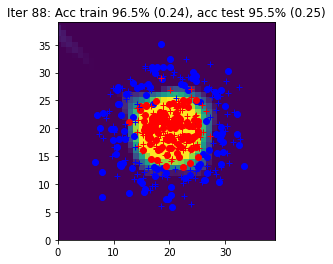

Ltrain tensor(0.2346)


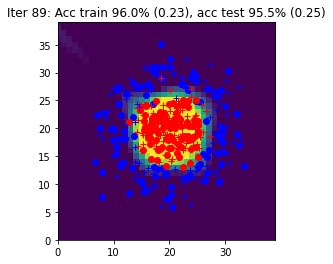

Ltrain tensor(0.2331)


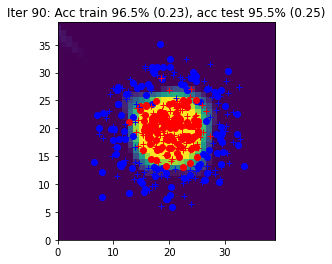

Ltrain tensor(0.2317)


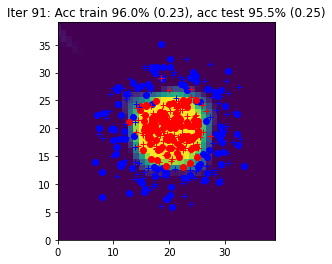

Ltrain tensor(0.2302)


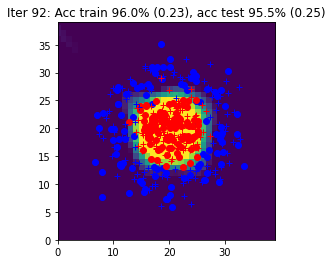

Ltrain tensor(0.2288)


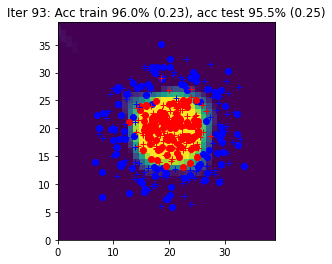

Ltrain tensor(0.2274)


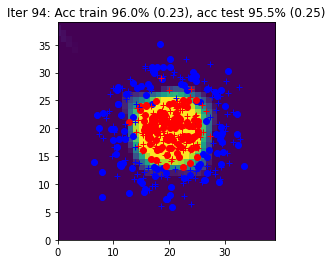

Ltrain tensor(0.2261)


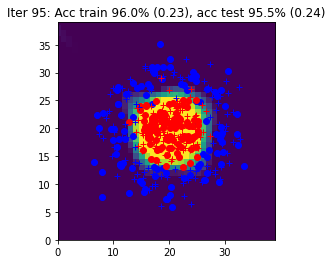

Ltrain tensor(0.2248)


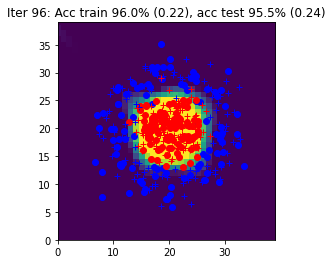

Ltrain tensor(0.2234)


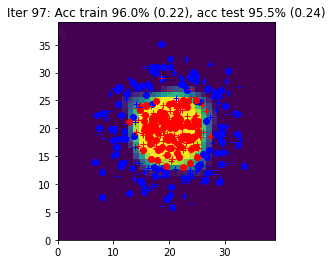

Ltrain tensor(0.2221)


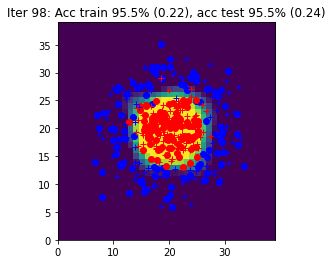

Ltrain tensor(0.2208)


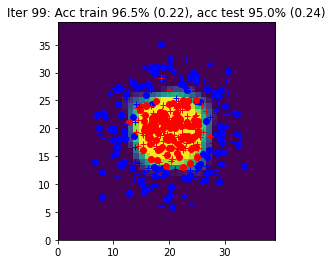

Ltrain tensor(0.2196)


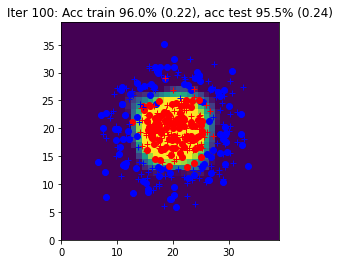

Ltrain tensor(0.2183)


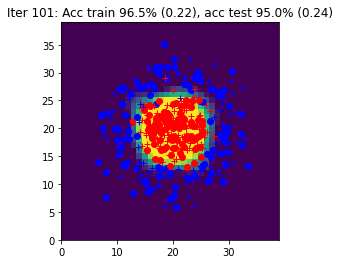

Ltrain tensor(0.2171)


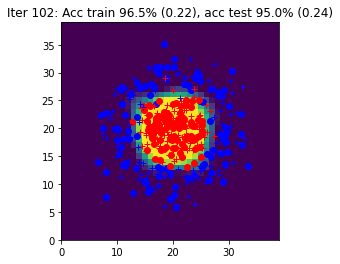

Ltrain tensor(0.2160)


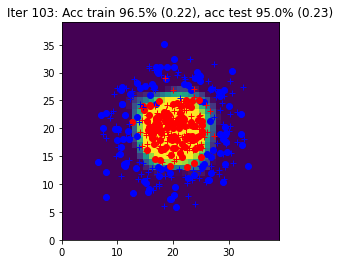

Ltrain tensor(0.2148)


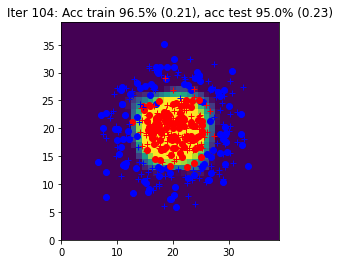

Ltrain tensor(0.2136)


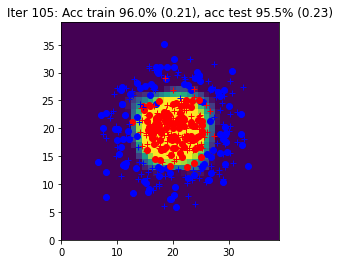

Ltrain tensor(0.2125)


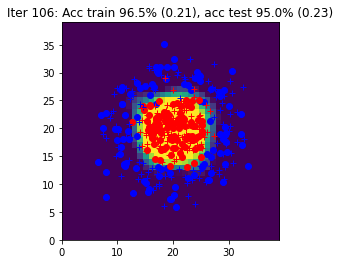

Ltrain tensor(0.2114)


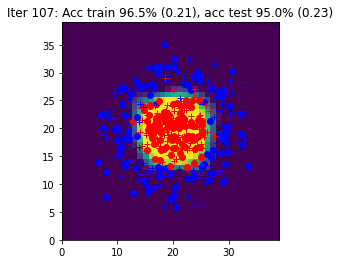

Ltrain tensor(0.2103)


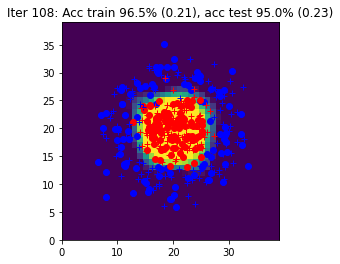

Ltrain tensor(0.2092)


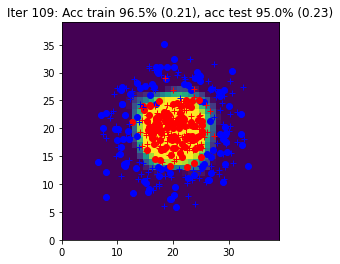

Ltrain tensor(0.2082)


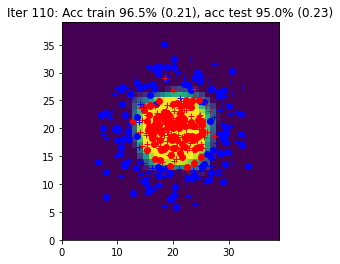

Ltrain tensor(0.2071)


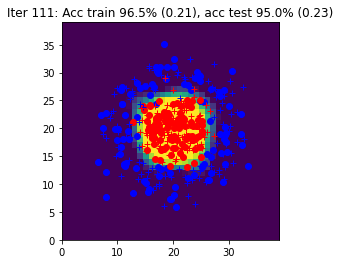

Ltrain tensor(0.2061)


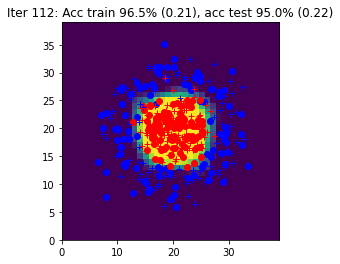

Ltrain tensor(0.2051)


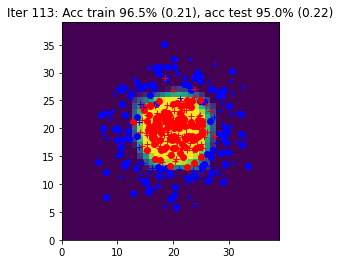

Ltrain tensor(0.2041)


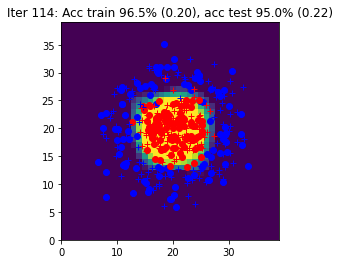

Ltrain tensor(0.2031)


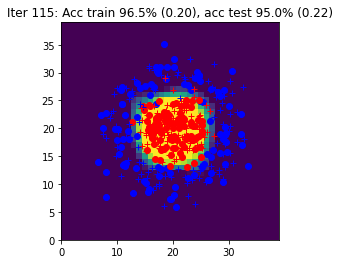

Ltrain tensor(0.2023)


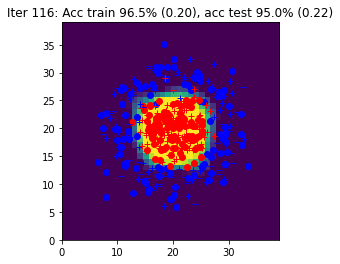

Ltrain tensor(0.2012)


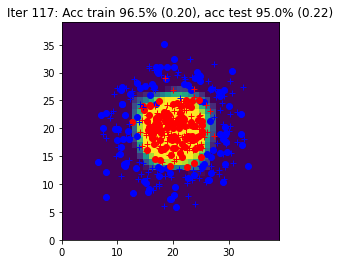

Ltrain tensor(0.2003)


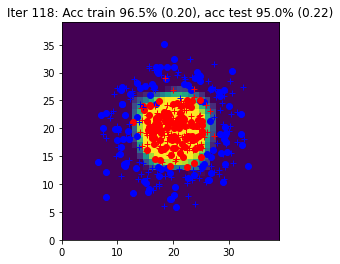

Ltrain tensor(0.1994)


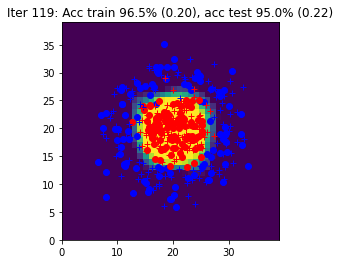

Ltrain tensor(0.1985)


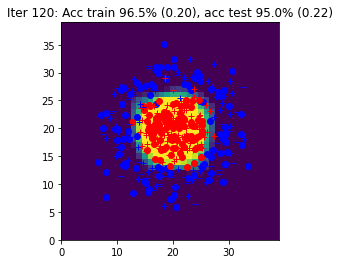

Ltrain tensor(0.1976)


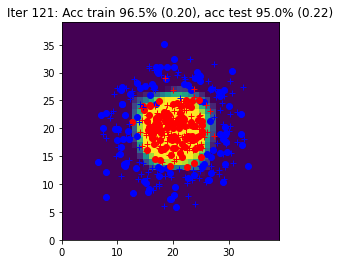

Ltrain tensor(0.1968)


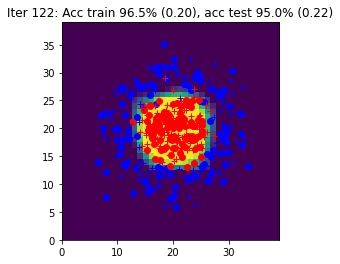

Ltrain tensor(0.1959)


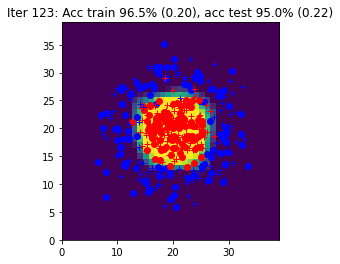

Ltrain tensor(0.1951)


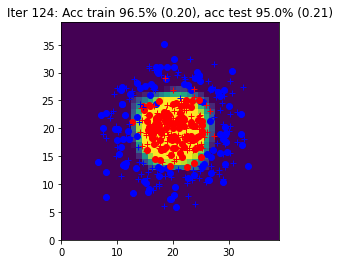

Ltrain tensor(0.1942)


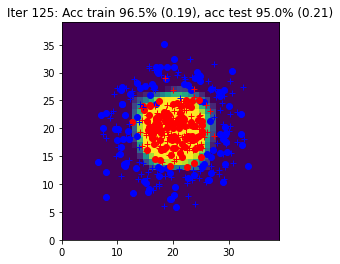

Ltrain tensor(0.1934)


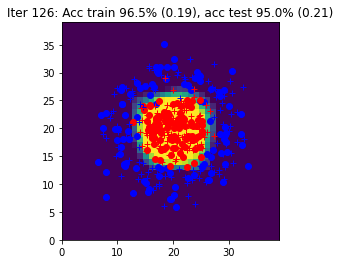

Ltrain tensor(0.1926)


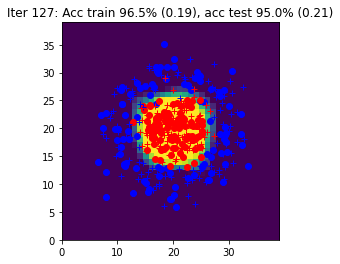

Ltrain tensor(0.1918)


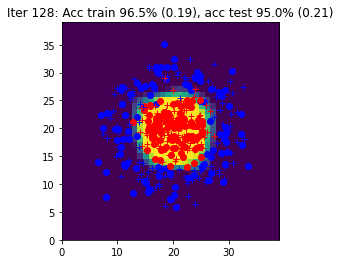

Ltrain tensor(0.1910)


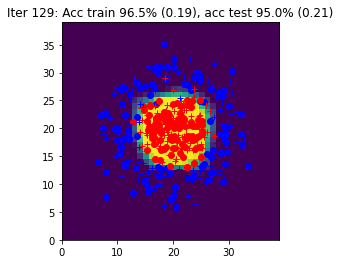

Ltrain tensor(0.1903)


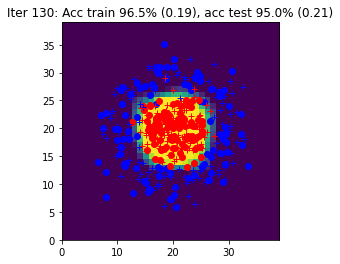

Ltrain tensor(0.1895)


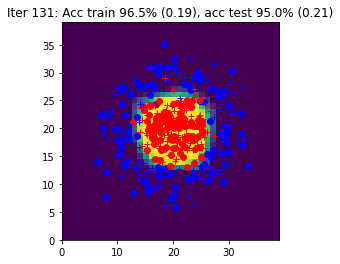

Ltrain tensor(0.1887)


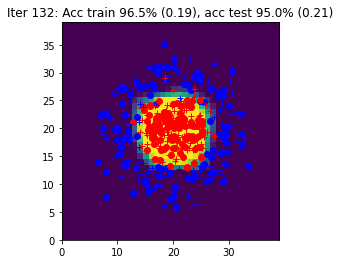

Ltrain tensor(0.1880)


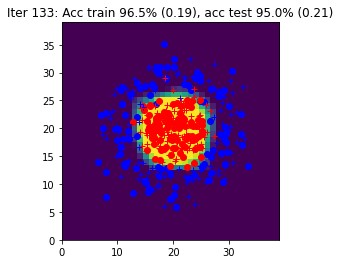

Ltrain tensor(0.1873)


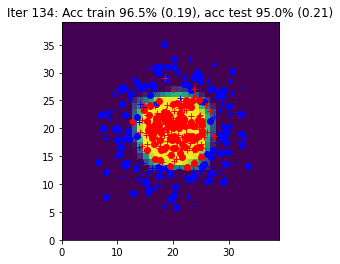

Ltrain tensor(0.1865)


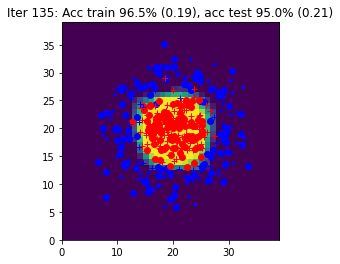

Ltrain tensor(0.1858)


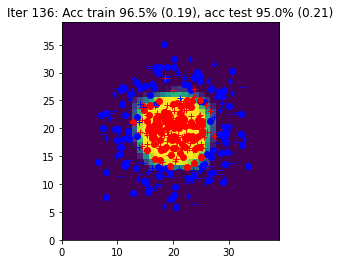

Ltrain tensor(0.1851)


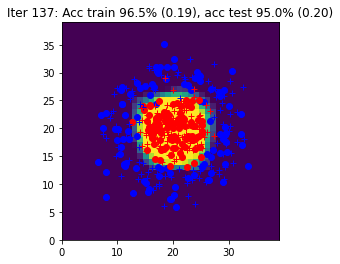

Ltrain tensor(0.1844)


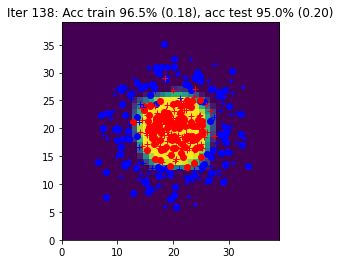

Ltrain tensor(0.1837)


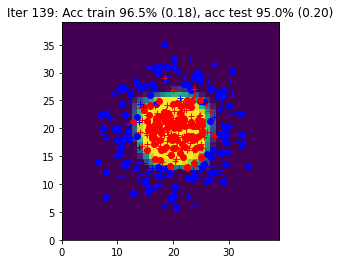

Ltrain tensor(0.1831)


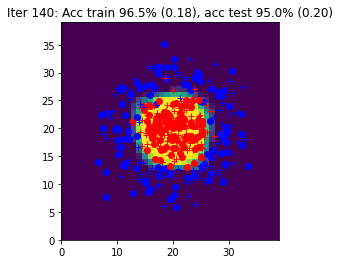

Ltrain tensor(0.1824)


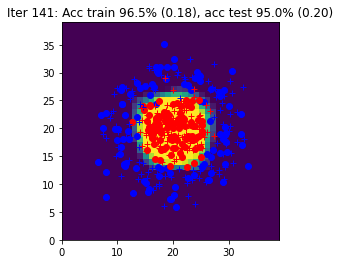

Ltrain tensor(0.1818)


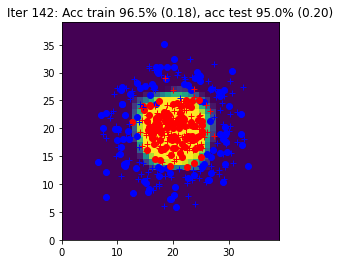

Ltrain tensor(0.1812)


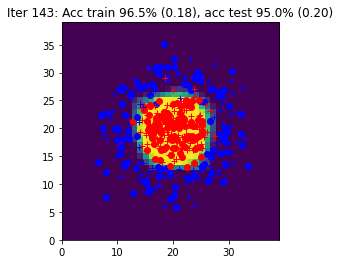

Ltrain tensor(0.1805)


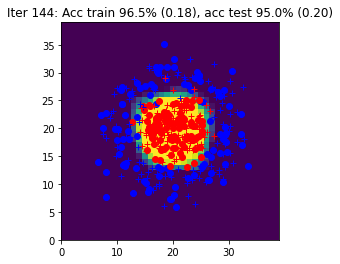

Ltrain tensor(0.1799)


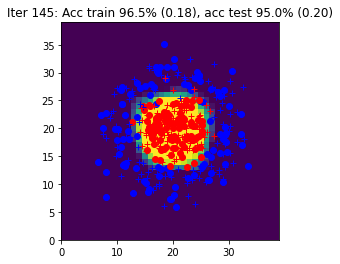

Ltrain tensor(0.1793)


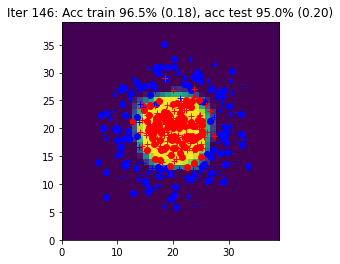

Ltrain tensor(0.1786)


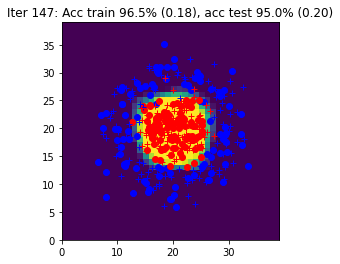

Ltrain tensor(0.1780)


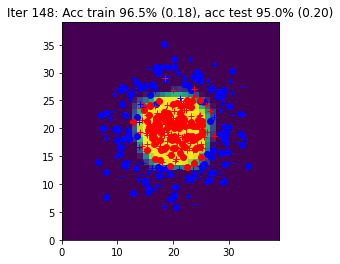

Ltrain tensor(0.1774)


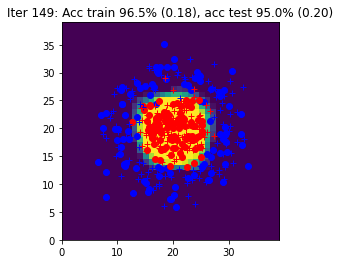

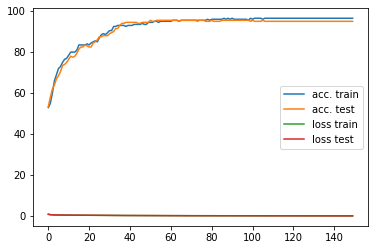

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

params = init_params(nx, nh, ny)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Votre code ici  ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]

        # écrire l'algorithme d'apprentissage sur le batch (X,Y)
        # en utilisant les fonctions forward, loss_accuracy, backward, sgd 
        Yhat, outputs = forward(params, X)
        loss, acc = loss_accuracy(Yhat, Y)
        grads = backward(params, outputs, Y)
        params = sgd(params, grads, eta)
    ####################
    ##      FIN        #
    ####################


    Yhat_train, output_train = forward(params, data.Xtrain)
    Yhat_test, _ = forward(params, data.Xtest)
    Ltrain, acctrain = loss_accuracy(Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(Yhat_test, data.Ytest)
    print("Ltrain",Ltrain)
    Ygrid, _ = forward(params, data.Xgrid)  
    grads = backward(params,output_train, Yhat_train)
    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    data.plot_data_with_grid(Ygrid, title)
    #print(title)
    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Partie 2 : Simplification du backward avec `torch.autograd`



In [ ]:
def init_params(nx, nh, ny):
    """
    nx, nh, ny: integers
    out params: dictionnary
    """
    params = {}
    #####################
    ## Votre code ici  ##
    #####################
    # remplir avec les paramètres Wh, Wy, bh, by
    params["Wh"] = torch.randn(nh, nx, requires_grad=True)
    params["Wy"] = torch.randn(ny, nh, requires_grad=True)
    params["bh"] = torch.zeros(nh, 1, requires_grad=True)
    params["by"] = torch.zeros(ny, 1, requires_grad=True)
    ####################
    ##      FIN        #
    ####################
    return params

La fonction `forward` est inchangée par rapport à la partie précédente. 

La fonction `backward` n'est plus utilisée grâce à l'autograd. 

In [ ]:
def sgd_auto(params, eta):

    #####################
    ## Votre code ici  ##
    #####################
    # mettre à jour le contenu de params
    with torch.no_grad():
        params["Wh"] -= eta * params["Wh"].grad
        params["Wy"] -= eta * params["Wy"].grad
        params["bh"] -= eta * params["bh"].grad
        params["by"] -= eta * params["by"].grad
        params["Wh"].grad.zero_()
        params["Wy"].grad.zero_()
        params["bh"].grad.zero_()
        params["by"].grad.zero_()
    ####################
    ##      FIN        #
    ####################
    return params

## Algorithme global d'apprentissage (avec autograd)

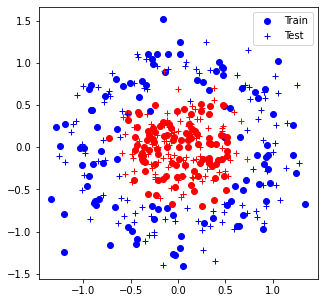

tensor([[-0.1672,  1.2060, -1.6725, -1.5095, -1.5485, -0.5259, -1.4228, -0.6491,
          0.5791,  1.1322],
        [-0.7074,  1.4918, -0.3816,  1.9058, -1.2986, -0.4482,  1.0499, -1.2448,
          0.4786, -0.5082]], requires_grad=True)


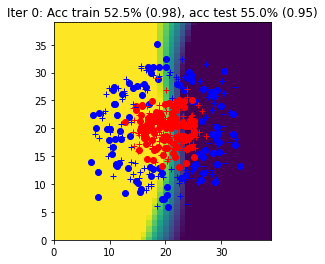

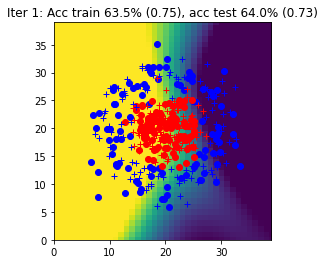

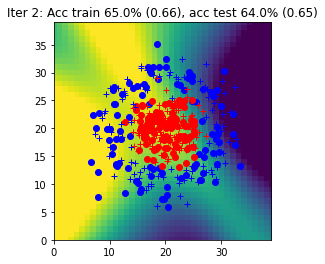

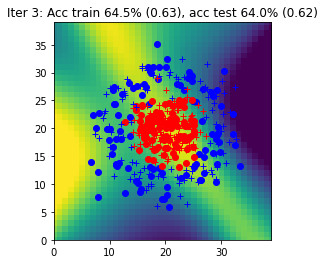

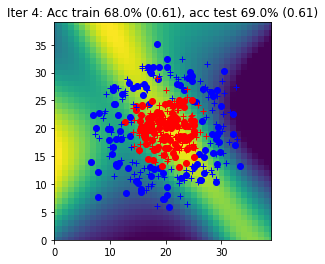

...

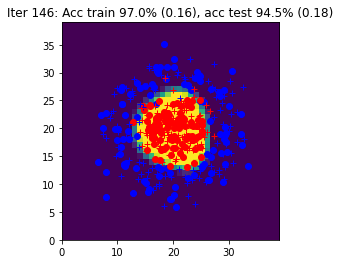

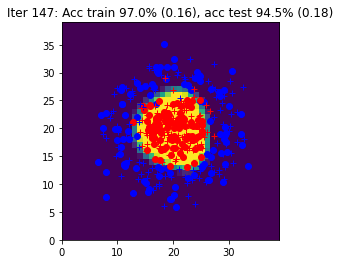

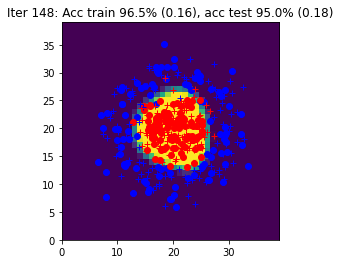

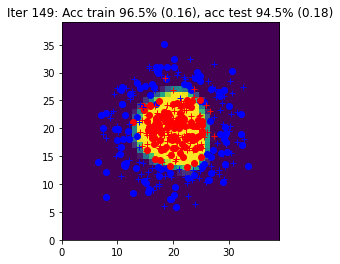

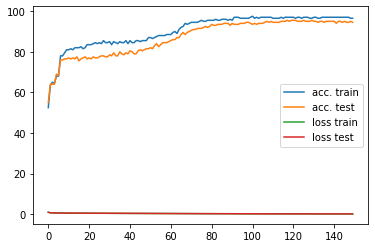

tensor([[ 1.3588,  1.0415, -1.7097, -1.7758, -2.2026, -0.2342, -2.1294, -1.0739,
          0.6227,  2.1137],
        [-2.2335,  1.6563, -0.3444,  2.1721, -0.6445, -0.7399,  1.7565, -0.8200,
          0.4350, -1.4898]], requires_grad=True)


In [ ]:
from torch import autograd
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

params = init_params(nx, nh, ny)
curves = [[],[], [], []]

# epoch
print(list(params.values())[1])
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Votre code ici  ##
    #####################

    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]
  
        # écrire l'algorithme d'apprentissage sur le batch (X,Y)
        # en utilisant les fonctions forward, loss_accuracy, sgd 
        # calculer les gradients avec la fonction backward de l'autograd 
        Yhat, outputs = forward(params, X)
        loss, _ = loss_accuracy(Yhat, Y)
        loss.backward()
        params = sgd_auto(params, eta)

    ####################
    ##      FIN        #
    ####################
    with torch.no_grad():
        Yhat_train, _ = forward(params, data.Xtrain)
        Yhat_test, _ = forward(params, data.Xtest)
        Ltrain, acctrain = loss_accuracy(Yhat_train, data.Ytrain)
        Ltest, acctest = loss_accuracy(Yhat_test, data.Ytest)
        Ygrid, _ = forward(params, data.Xgrid)  
        title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
        #print(title)
        # detach() est utilisé pour détacher les predictions du graphes de calcul autograd
        data.plot_data_with_grid(Ygrid.detach(), title)
        curves[0].append(acctrain)
        curves[1].append(acctest)
        curves[2].append(Ltrain)
        curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()
print(list(params.values())[1])

# Partie 3 : Simplification du forward avec `torch.nn`

`init_params` et `forward` sont supprimés et remplacés par une fonction `init_model` qui déclare l'architecture du modèle et la loss.

In [ ]:
def init_model(nx, nh, ny):

    #####################
    ## Votre code ici  ##
    #####################

    model = torch.nn.Sequential(
    torch.nn.Linear(nx, nh),
    torch.nn.Tanh(),
    torch.nn.Linear(nh, ny),
    torch.nn.Softmax()
    )
    loss = torch.nn.CrossEntropyLoss()

    ####################
    ##      FIN        #
    ####################
    return model, loss

In [ ]:
def loss_accuracy(loss, Yhat, Y):

    #####################
    ## Votre code ici  ##
    #####################
    # faire appel à la fonction de loss
    Y  = torch.max(Y, 1)[1]
    L = loss(Yhat,Y)
    Yhat_transformed  = torch.max(Yhat, 1)[1]
    acc = torch.sum(Yhat_transformed == Y) * 100. / Yhat_transformed.size(0)
    ####################
    ##      FIN        #
    ####################
    return L, acc

In [ ]:
def sgd(model, eta):
    #####################
    ## Votre code ici  ##
    #####################
    # mettre à jour les paramètres de model
    # attention à bien utiliser torch.no_grad()
    # et à remettre les accumulateurs de gradients à zéro
    with torch.no_grad():
        for param in model.parameters():
            param -= eta * param.grad
        model.zero_grad()
    ####################
    ##      FIN        #
    ####################
    return model

## Algorithme global d'apprentissage (avec autograd et les couches `torch.nn`)

In [ ]:
Xtrain.shape

torch.Size([200, 2])

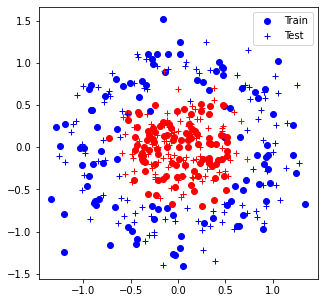

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 0: Acc train 50.5% (0.69), acc test 50.0% (0.69)


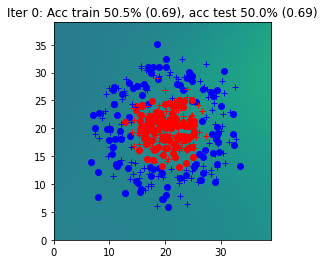

Iter 1: Acc train 44.0% (0.69), acc test 44.0% (0.69)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


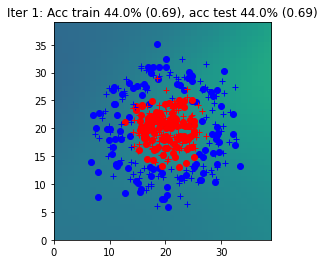

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 2: Acc train 50.0% (0.68), acc test 50.0% (0.69)


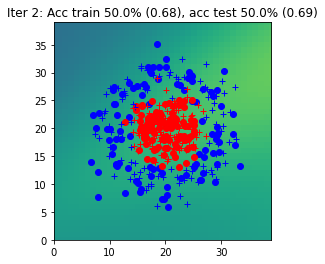

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 3: Acc train 71.5% (0.67), acc test 68.5% (0.67)


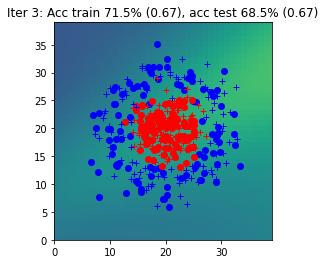

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 4: Acc train 54.5% (0.67), acc test 54.5% (0.67)


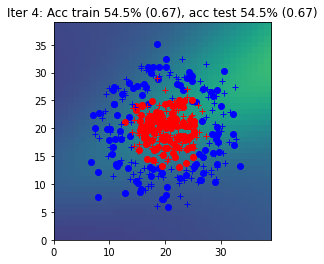

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 5: Acc train 79.5% (0.65), acc test 78.0% (0.65)


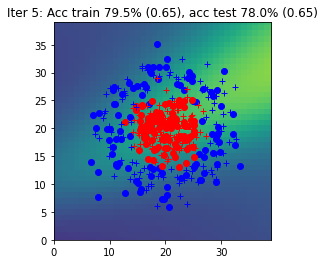

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 6: Acc train 68.5% (0.63), acc test 67.5% (0.64)


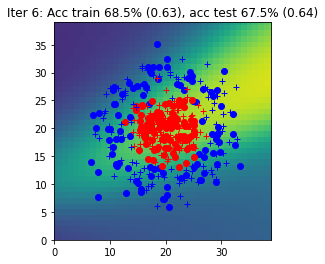

Iter 7: Acc train 75.0% (0.61), acc test 79.5% (0.61)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


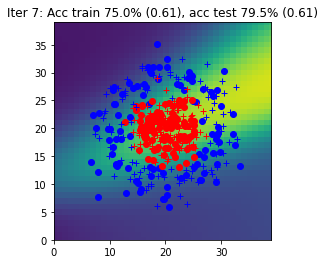

Iter 8: Acc train 82.5% (0.59), acc test 81.0% (0.59)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


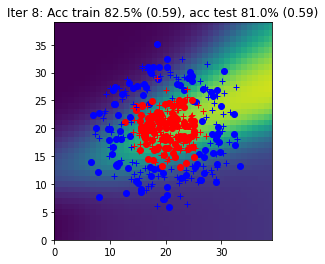

Iter 9: Acc train 75.5% (0.58), acc test 79.5% (0.57)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


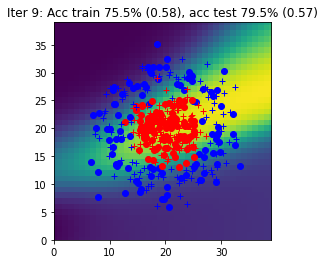

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 10: Acc train 76.5% (0.56), acc test 79.5% (0.56)


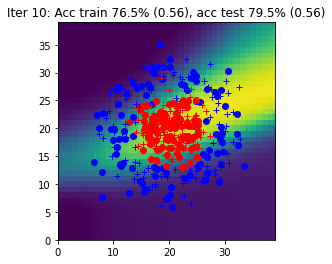

Iter 11: Acc train 75.5% (0.55), acc test 81.0% (0.55)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


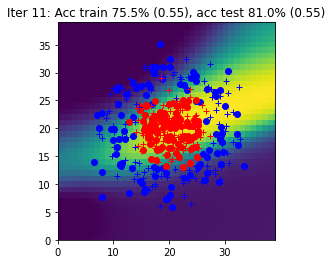

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 12: Acc train 81.0% (0.54), acc test 81.0% (0.54)


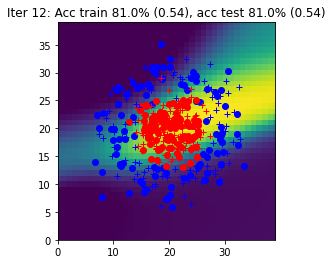

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 13: Acc train 82.5% (0.53), acc test 82.0% (0.53)


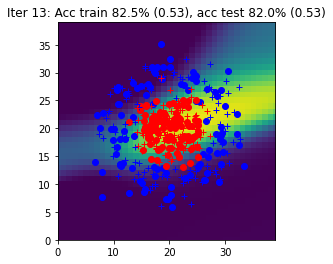

Iter 14: Acc train 84.0% (0.52), acc test 82.5% (0.52)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


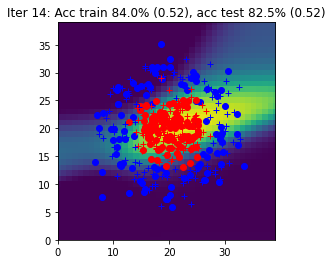

Iter 15: Acc train 85.0% (0.50), acc test 84.0% (0.50)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


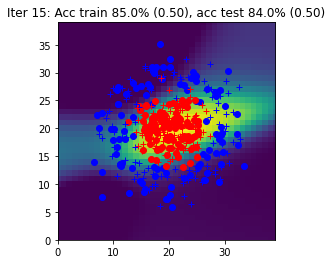

Iter 16: Acc train 84.5% (0.49), acc test 87.5% (0.49)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


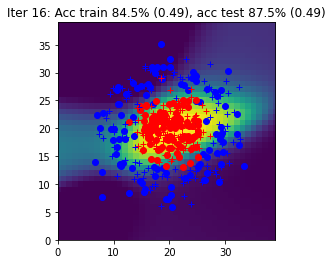

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 17: Acc train 88.0% (0.47), acc test 89.5% (0.47)


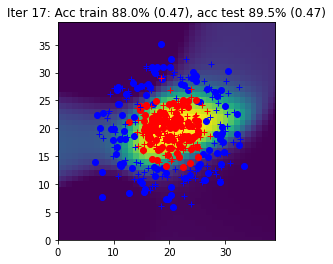

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 18: Acc train 91.5% (0.46), acc test 93.5% (0.46)


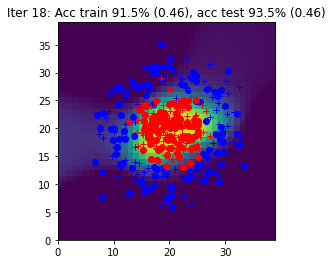

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 19: Acc train 91.5% (0.45), acc test 91.5% (0.45)


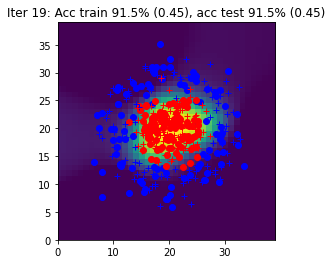

Iter 20: Acc train 93.0% (0.43), acc test 94.5% (0.43)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


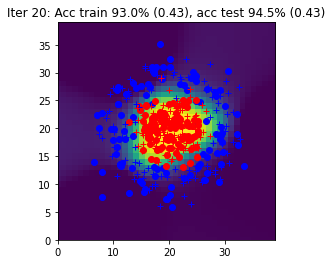

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 21: Acc train 93.5% (0.43), acc test 95.0% (0.43)


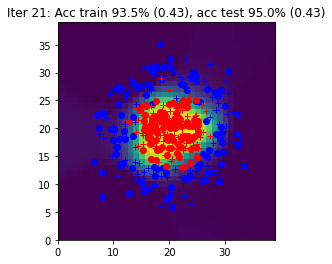

Iter 22: Acc train 95.0% (0.42), acc test 94.5% (0.42)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


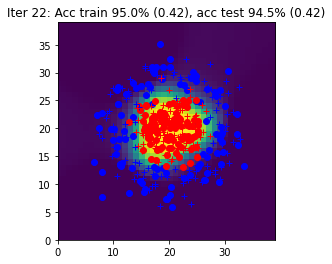

Iter 23: Acc train 93.5% (0.42), acc test 95.5% (0.42)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


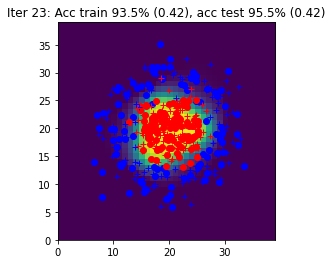

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 24: Acc train 94.5% (0.41), acc test 93.5% (0.41)


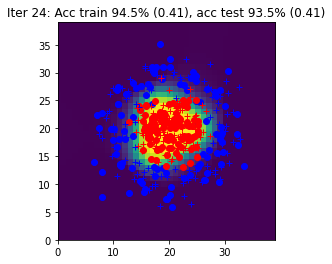

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 25: Acc train 93.0% (0.41), acc test 95.0% (0.41)


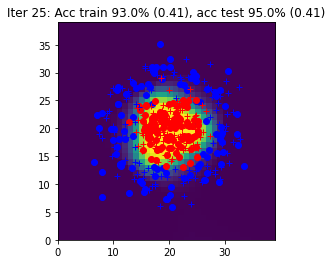

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 26: Acc train 94.5% (0.41), acc test 96.0% (0.41)


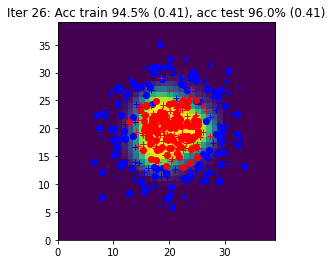

Iter 27: Acc train 94.0% (0.41), acc test 95.0% (0.41)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


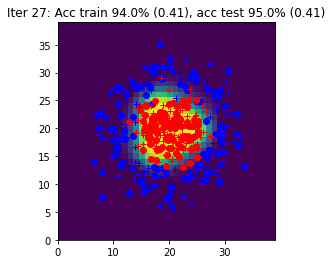

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 28: Acc train 94.5% (0.41), acc test 95.0% (0.41)


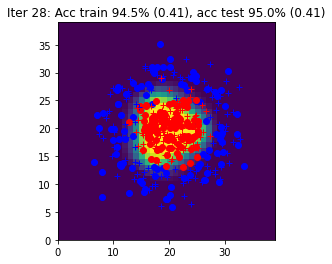

Iter 29: Acc train 94.0% (0.40), acc test 95.5% (0.40)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


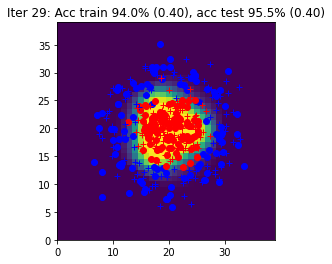

Iter 30: Acc train 94.5% (0.40), acc test 95.5% (0.40)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


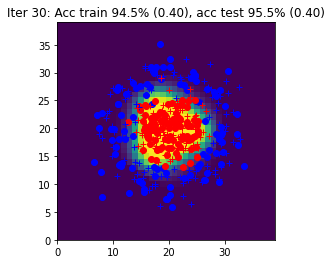

Iter 31: Acc train 94.5% (0.40), acc test 95.0% (0.40)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


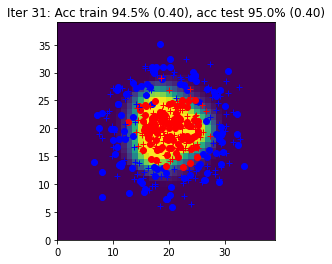

Iter 32: Acc train 94.5% (0.40), acc test 95.5% (0.40)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


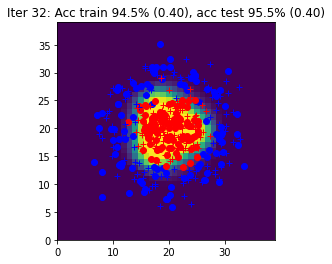

Iter 33: Acc train 94.5% (0.39), acc test 95.5% (0.39)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


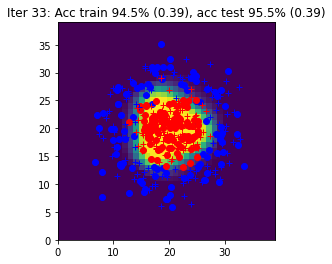

Iter 34: Acc train 94.0% (0.40), acc test 93.5% (0.40)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


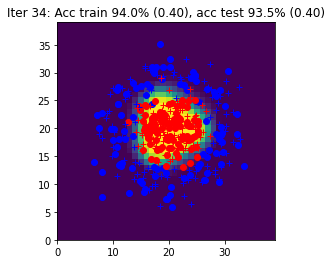

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 35: Acc train 94.0% (0.39), acc test 95.5% (0.40)


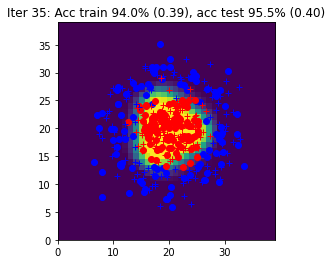

Iter 36: Acc train 93.0% (0.40), acc test 92.5% (0.40)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


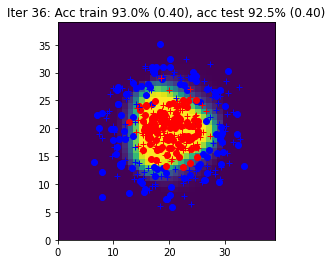

Iter 37: Acc train 93.5% (0.40), acc test 93.5% (0.39)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


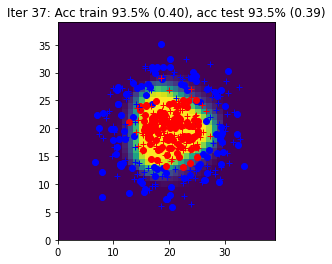

Iter 38: Acc train 94.5% (0.39), acc test 95.0% (0.39)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


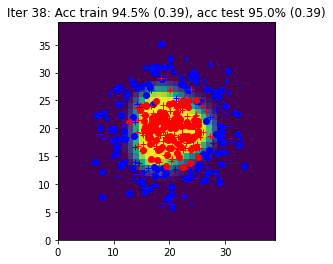

Iter 39: Acc train 94.0% (0.39), acc test 95.0% (0.39)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


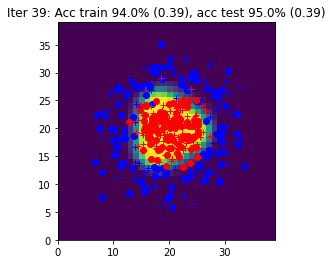

Iter 40: Acc train 94.0% (0.39), acc test 96.0% (0.39)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


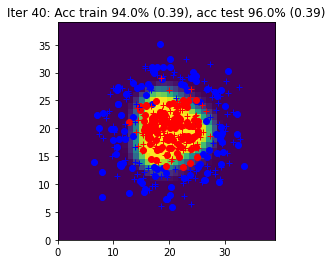

Iter 41: Acc train 94.0% (0.39), acc test 94.5% (0.39)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


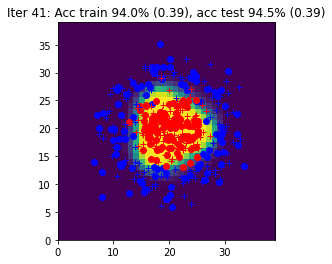

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 42: Acc train 93.0% (0.39), acc test 93.5% (0.39)


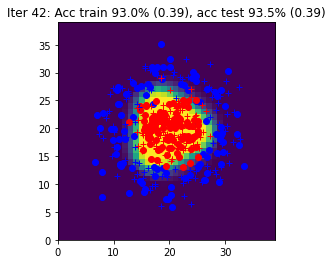

Iter 43: Acc train 94.0% (0.39), acc test 95.5% (0.39)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


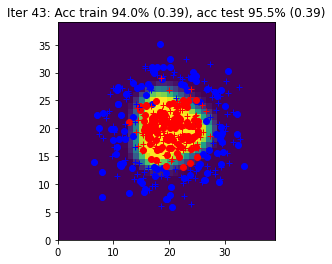

Iter 44: Acc train 93.5% (0.39), acc test 94.0% (0.39)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


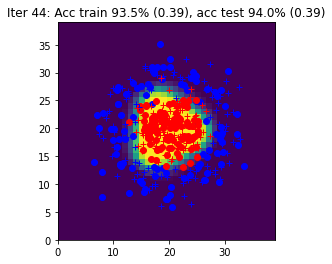

Iter 45: Acc train 94.0% (0.39), acc test 95.5% (0.39)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


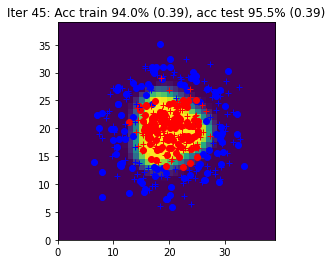

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 46: Acc train 94.5% (0.39), acc test 95.5% (0.39)


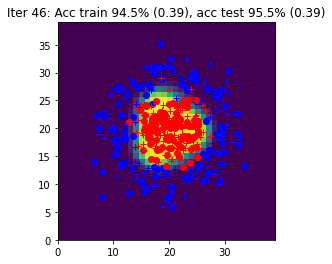

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 47: Acc train 93.5% (0.39), acc test 94.0% (0.39)


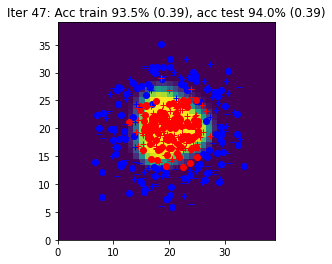

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 48: Acc train 94.5% (0.39), acc test 95.5% (0.38)


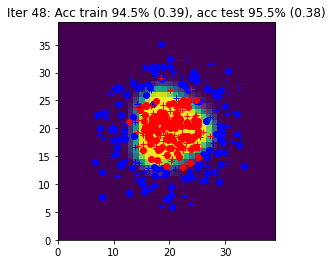

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 49: Acc train 95.0% (0.39), acc test 95.5% (0.38)


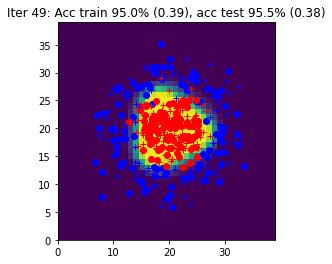

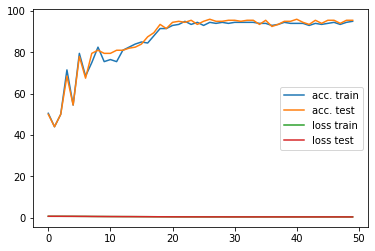

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.5

model, loss = init_model(nx, nh, ny)

curves = [[],[], [], []]
# epoch
for iteration in range(50):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Votre code ici  ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]
        # écrire l'algorithme d'apprentissage sur le batch (X,Y)
        # en utilisant les fonctions loss_accuracy, sgd
        # effectuer le forward en faisant un appel au modèle 
        # calculer les gradients avec la fonction backward de l'autograd 
        Yhat = model.forward(X)
        #print(Y)
        model_loss, _ = loss_accuracy(loss,Yhat,Y)
        model_loss.backward()
        model = sgd(model, eta)

    ####################
    ##      FIN        #
    ####################

    with torch.no_grad():
        Yhat_train = model(data.Xtrain)
        Yhat_test = model(data.Xtest)
        Ltrain, acctrain = loss_accuracy(loss, Yhat_train,  data.Ytrain)
        Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)
        Ygrid = model(data.Xgrid)  

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title) 
    data.plot_data_with_grid(torch.nn.functional.softmax(Ygrid.detach(), dim=1), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

In [ ]:
torch.max(torch.tensor([[0,3],
                        [1,0],
                        [1,2]]), 1)[1]

tensor([1, 0, 1])

# Partie 4 : Simplification de SGD avec `torch.optim`

In [ ]:
def init_model(nx, nh, ny, eta):

    #####################
    ## Votre code ici  ##
    #####################

    model = torch.nn.Sequential(
    torch.nn.Linear(nx, nh),
    torch.nn.Tanh(),
    torch.nn.Linear(nh, ny),
    torch.nn.Softmax()
    )
    loss = torch.nn.CrossEntropyLoss()
    optim = torch.optim.Adam(params=model.parameters(),lr=eta)

    ####################
    ##      FIN        #
    ####################

    return model, loss, optim

La fonction `sgd` est supprimée. À la place, on fera un appel à `optim.zero_grad()` avant de faire le backward et à `optim.step()` après le backward. 

## Algorithme global d'apprentissage (avec autograd, les couches `torch.nn` et `torch.optim`)

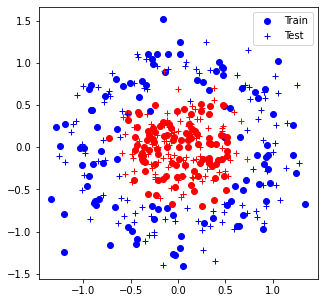

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 0: Acc train 57.5% (0.67), acc test 56.5% (0.67)


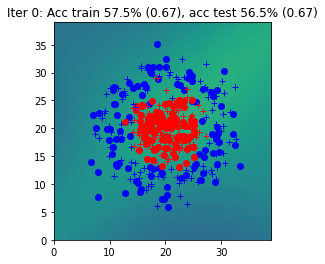

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 1: Acc train 67.0% (0.64), acc test 67.0% (0.64)


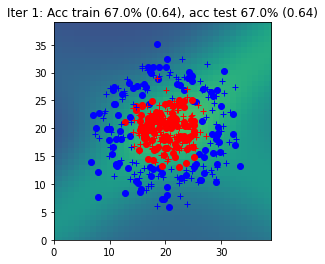

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 2: Acc train 87.0% (0.60), acc test 86.5% (0.60)


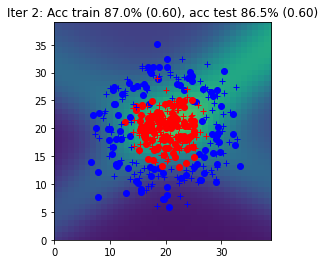

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 3: Acc train 91.0% (0.54), acc test 90.0% (0.54)


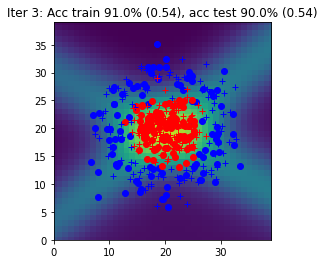

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 4: Acc train 90.5% (0.50), acc test 92.5% (0.50)


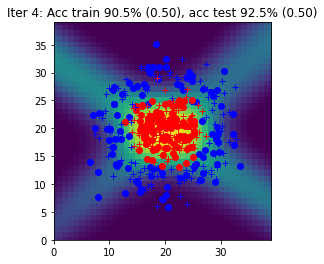

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 5: Acc train 88.5% (0.48), acc test 86.5% (0.49)


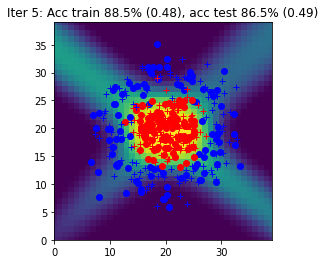

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 6: Acc train 92.5% (0.45), acc test 92.5% (0.46)


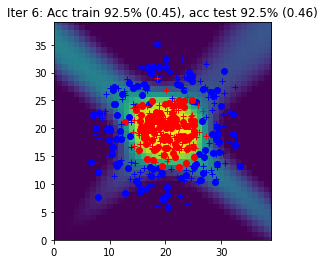

Iter 7: Acc train 95.5% (0.43), acc test 93.5% (0.44)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


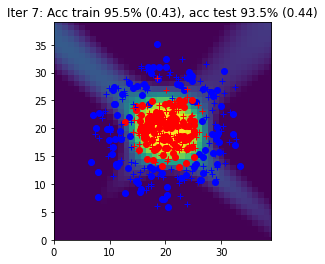

Iter 8: Acc train 95.0% (0.42), acc test 95.0% (0.42)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


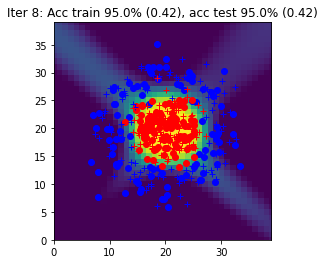

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 9: Acc train 95.5% (0.41), acc test 94.5% (0.42)


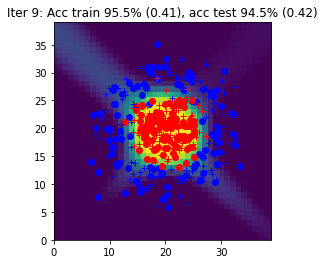

Iter 10: Acc train 96.0% (0.40), acc test 95.0% (0.41)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


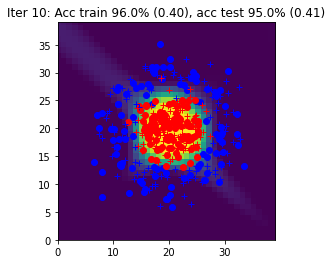

Iter 11: Acc train 95.0% (0.40), acc test 94.5% (0.41)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


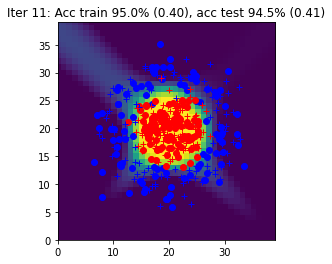

Iter 12: Acc train 95.0% (0.40), acc test 95.5% (0.41)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


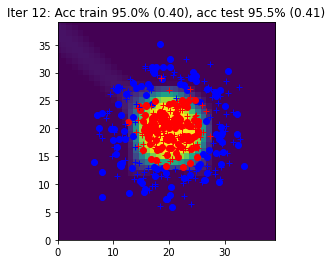

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 13: Acc train 95.0% (0.39), acc test 95.5% (0.39)


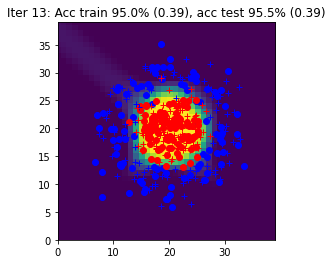

Iter 14: Acc train 96.0% (0.39), acc test 93.5% (0.40)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


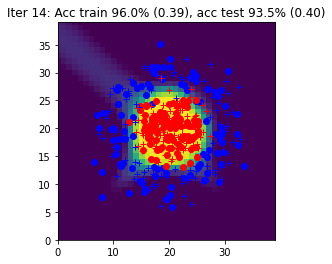

Iter 15: Acc train 95.5% (0.39), acc test 95.0% (0.39)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


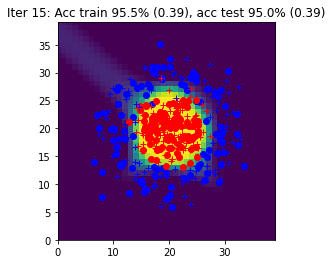

Iter 16: Acc train 97.0% (0.38), acc test 95.0% (0.39)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


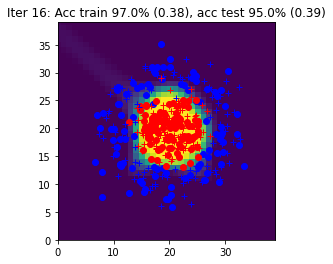

Iter 17: Acc train 97.5% (0.38), acc test 95.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


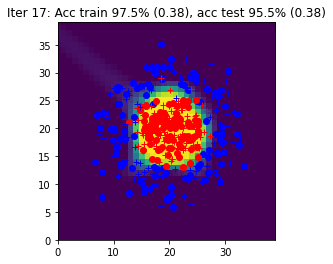

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 18: Acc train 94.5% (0.38), acc test 95.5% (0.39)


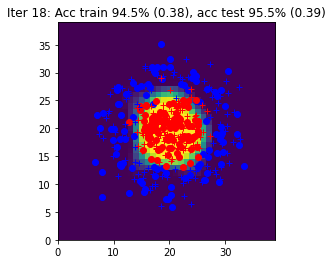

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 19: Acc train 98.0% (0.37), acc test 95.5% (0.38)


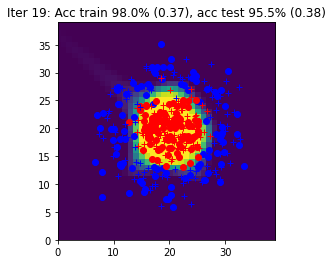

Iter 20: Acc train 94.5% (0.37), acc test 94.5% (0.39)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


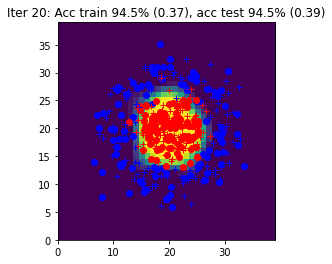

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 21: Acc train 96.0% (0.37), acc test 95.5% (0.38)


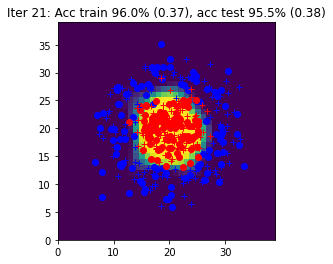

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 22: Acc train 96.5% (0.37), acc test 95.0% (0.38)


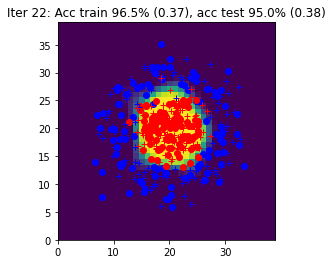

Iter 23: Acc train 97.5% (0.37), acc test 95.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


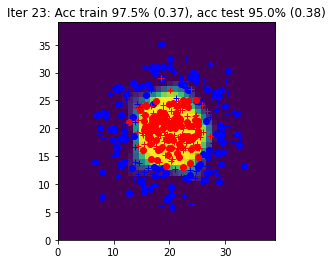

Iter 24: Acc train 94.0% (0.38), acc test 92.0% (0.39)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


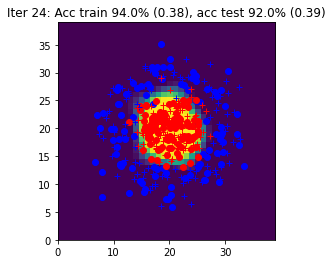

Iter 25: Acc train 98.0% (0.37), acc test 95.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


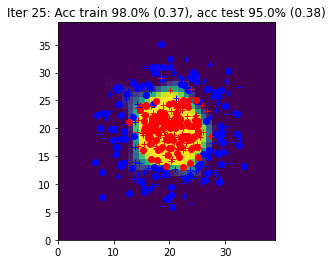

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 26: Acc train 98.0% (0.37), acc test 95.0% (0.38)


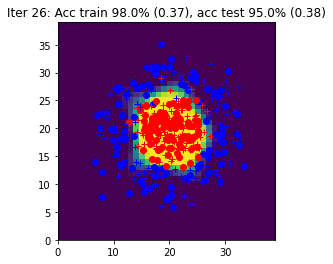

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 27: Acc train 97.5% (0.36), acc test 94.5% (0.38)


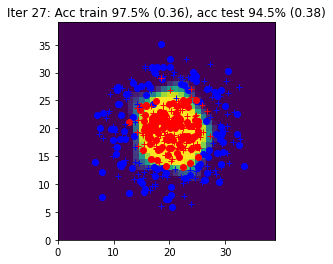

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 28: Acc train 95.0% (0.37), acc test 93.5% (0.39)


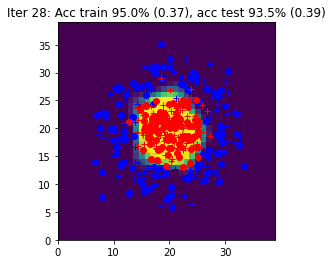

Iter 29: Acc train 98.0% (0.36), acc test 95.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


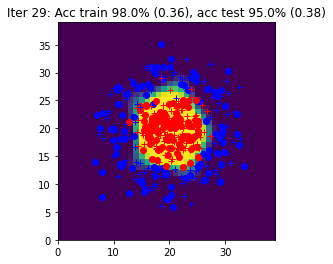

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 30: Acc train 98.0% (0.36), acc test 95.0% (0.38)


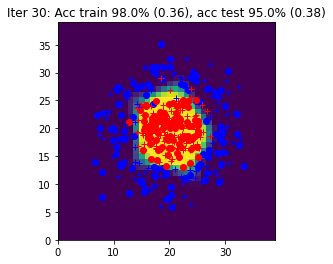

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 31: Acc train 95.0% (0.37), acc test 94.5% (0.38)


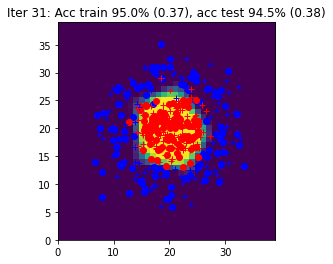

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 32: Acc train 97.5% (0.36), acc test 94.5% (0.38)


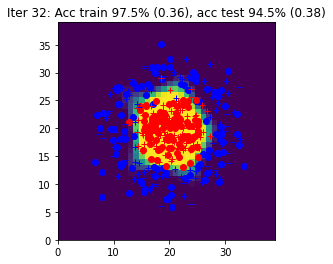

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 33: Acc train 98.0% (0.36), acc test 95.0% (0.38)


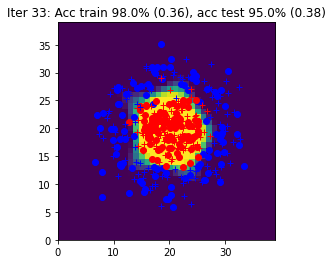

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 34: Acc train 97.0% (0.36), acc test 95.0% (0.38)


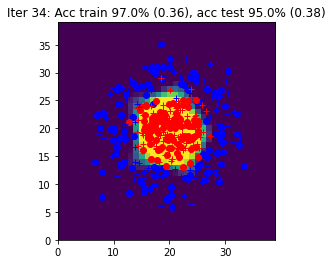

Iter 35: Acc train 97.0% (0.36), acc test 95.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


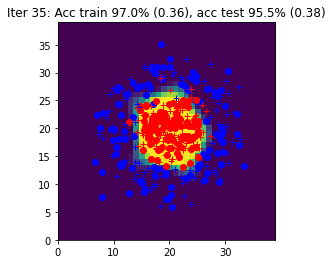

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 36: Acc train 97.0% (0.36), acc test 95.5% (0.38)


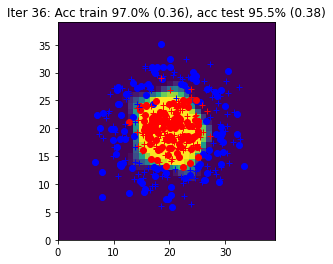

Iter 37: Acc train 96.5% (0.36), acc test 94.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


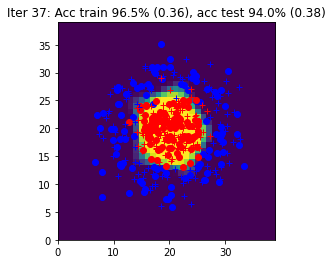

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 38: Acc train 97.5% (0.36), acc test 95.0% (0.38)


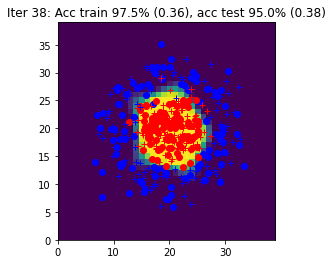

Iter 39: Acc train 97.0% (0.36), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


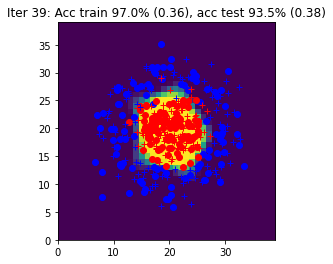

Iter 40: Acc train 98.0% (0.36), acc test 94.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


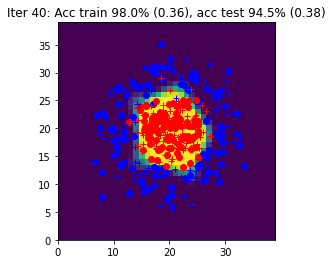

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 41: Acc train 98.0% (0.36), acc test 94.0% (0.38)


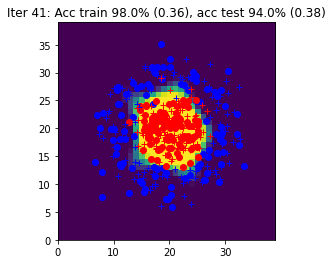

Iter 42: Acc train 96.0% (0.36), acc test 94.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


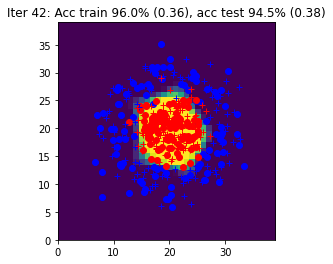

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 43: Acc train 97.5% (0.36), acc test 95.5% (0.37)


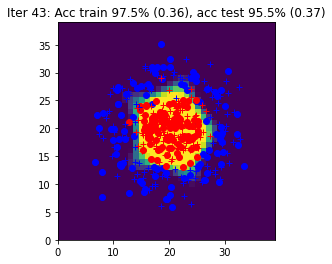

Iter 44: Acc train 97.0% (0.36), acc test 95.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


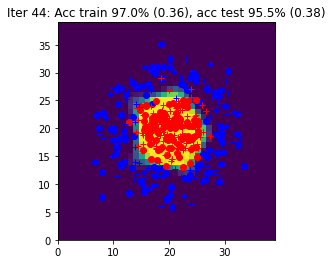

Iter 45: Acc train 94.5% (0.37), acc test 93.0% (0.39)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


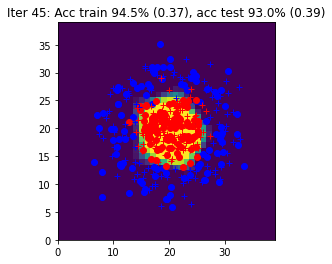

Iter 46: Acc train 97.5% (0.36), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


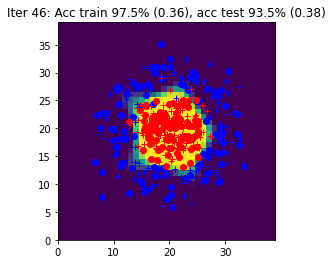

Iter 47: Acc train 98.0% (0.35), acc test 94.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


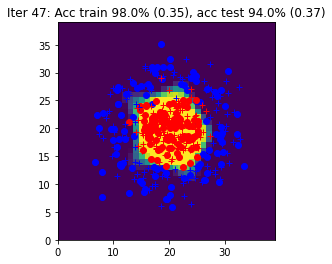

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 48: Acc train 96.5% (0.36), acc test 94.0% (0.38)


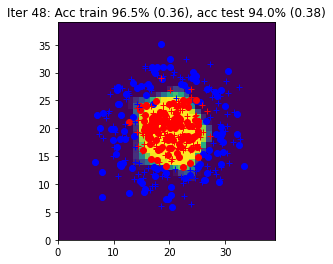

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 49: Acc train 98.0% (0.36), acc test 93.5% (0.38)


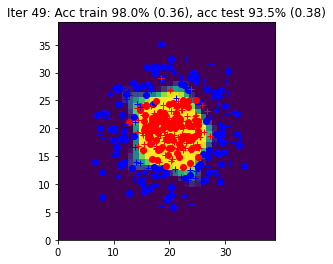

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 50: Acc train 97.5% (0.35), acc test 94.0% (0.38)


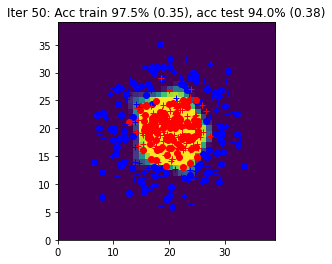

Iter 51: Acc train 98.0% (0.36), acc test 95.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


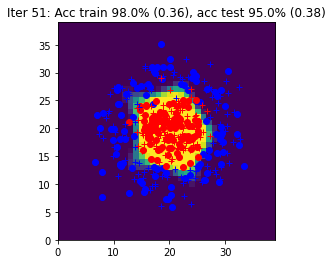

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 52: Acc train 98.0% (0.35), acc test 94.0% (0.38)


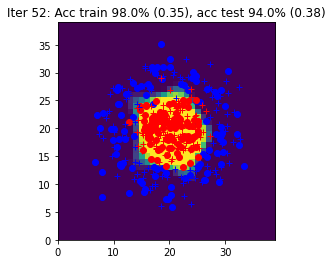

Iter 53: Acc train 98.0% (0.35), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


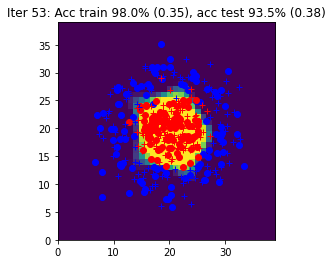

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 54: Acc train 98.0% (0.35), acc test 93.5% (0.38)


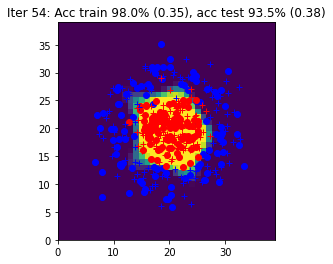

Iter 55: Acc train 97.5% (0.35), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


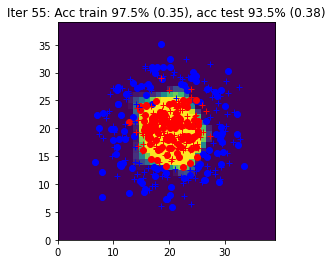

Iter 56: Acc train 97.5% (0.35), acc test 94.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


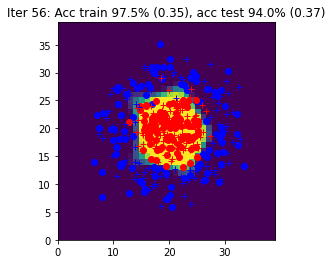

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 57: Acc train 98.0% (0.35), acc test 93.0% (0.38)


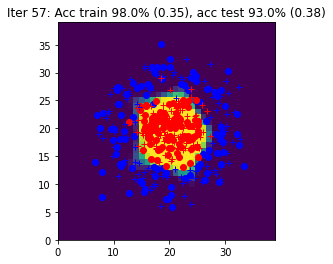

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 58: Acc train 98.0% (0.35), acc test 93.5% (0.37)


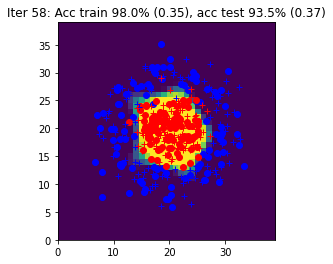

Iter 59: Acc train 98.0% (0.35), acc test 94.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


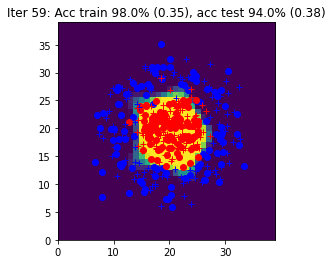

Iter 60: Acc train 97.5% (0.35), acc test 94.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


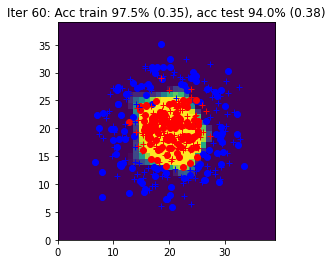

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 61: Acc train 98.0% (0.35), acc test 93.0% (0.38)


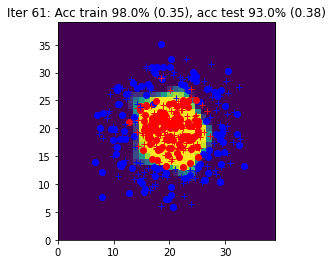

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 62: Acc train 97.0% (0.35), acc test 94.0% (0.38)


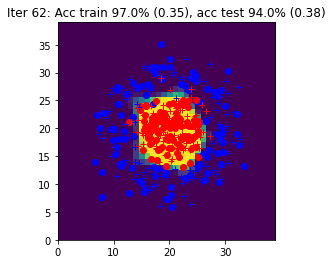

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 63: Acc train 97.5% (0.35), acc test 93.5% (0.38)


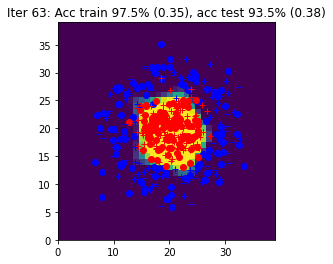

Iter 64: Acc train 98.0% (0.35), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


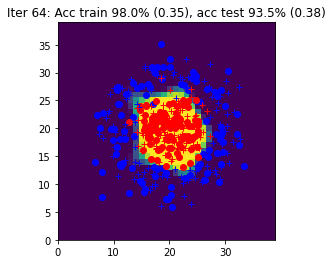

Iter 65: Acc train 98.0% (0.35), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


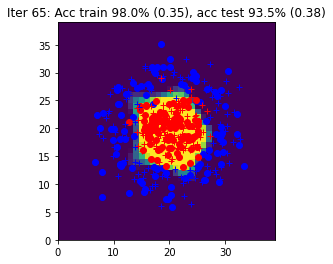

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 66: Acc train 98.0% (0.35), acc test 93.0% (0.38)


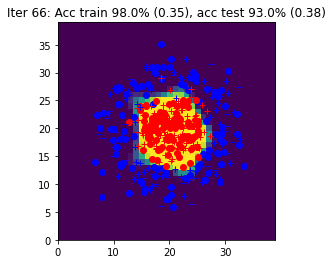

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 67: Acc train 98.0% (0.35), acc test 93.5% (0.38)


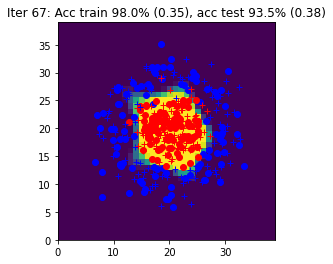

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 68: Acc train 97.5% (0.35), acc test 94.0% (0.38)


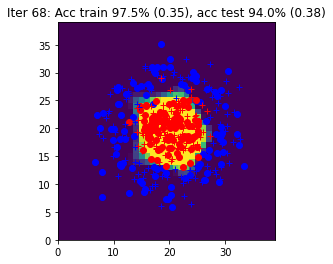

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 69: Acc train 98.0% (0.35), acc test 93.5% (0.38)


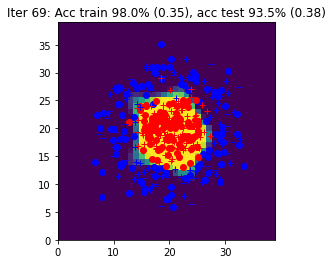

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 70: Acc train 97.5% (0.35), acc test 94.0% (0.37)


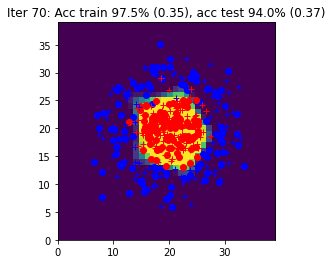

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 71: Acc train 98.0% (0.35), acc test 93.5% (0.38)


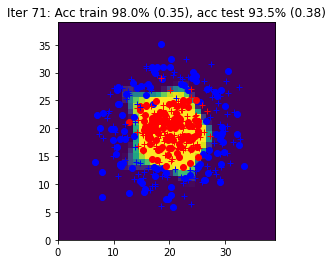

Iter 72: Acc train 98.0% (0.35), acc test 93.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


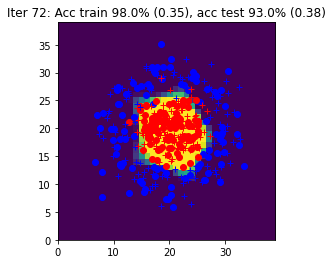

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 73: Acc train 97.5% (0.35), acc test 93.5% (0.38)


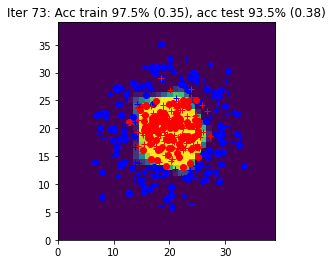

Iter 74: Acc train 97.5% (0.35), acc test 94.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


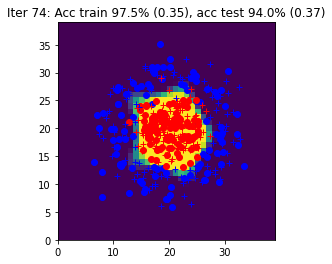

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 75: Acc train 97.5% (0.35), acc test 93.5% (0.37)


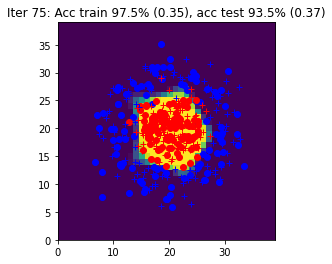

Iter 76: Acc train 98.0% (0.35), acc test 94.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


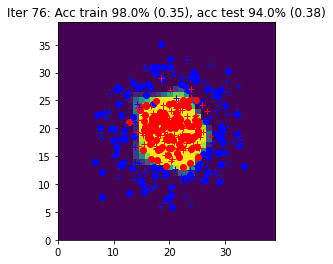

Iter 77: Acc train 98.0% (0.35), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


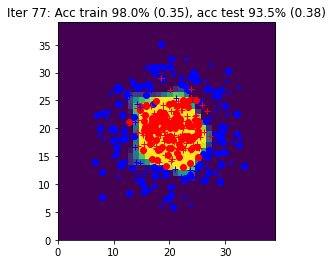

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 78: Acc train 98.0% (0.35), acc test 93.5% (0.37)


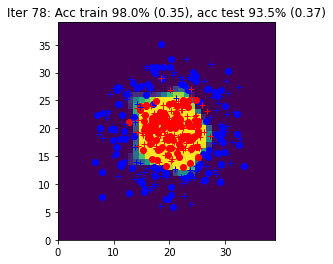

Iter 79: Acc train 97.5% (0.35), acc test 94.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


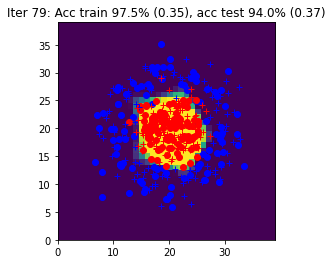

Iter 80: Acc train 98.0% (0.35), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


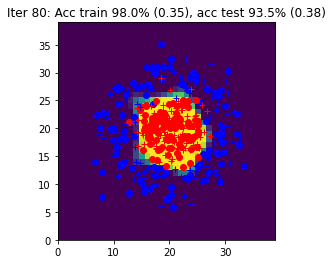

Iter 81: Acc train 98.0% (0.35), acc test 93.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


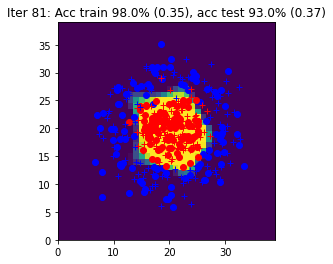

Iter 82: Acc train 97.5% (0.35), acc test 94.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


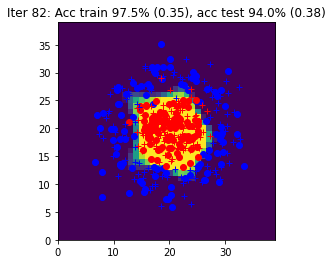

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 83: Acc train 98.0% (0.35), acc test 94.0% (0.37)


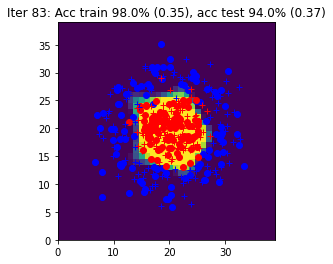

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 84: Acc train 98.0% (0.35), acc test 92.5% (0.38)


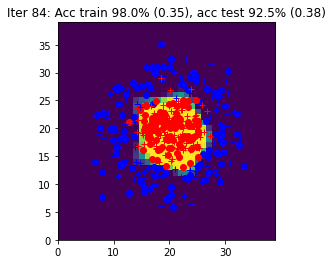

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 85: Acc train 98.0% (0.35), acc test 93.5% (0.38)


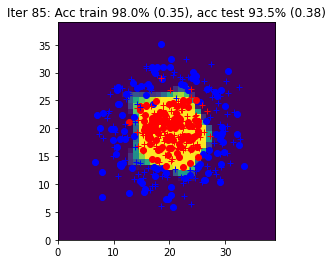

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 86: Acc train 98.0% (0.34), acc test 93.5% (0.37)


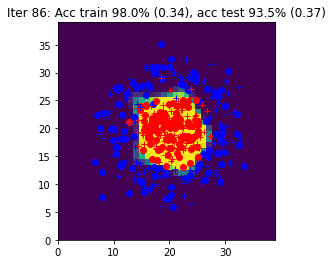

Iter 87: Acc train 98.0% (0.35), acc test 94.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


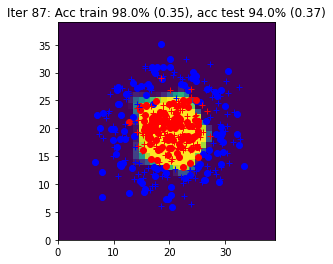

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 88: Acc train 98.0% (0.34), acc test 94.0% (0.37)


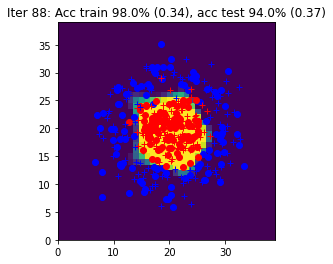

Iter 89: Acc train 98.0% (0.34), acc test 94.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


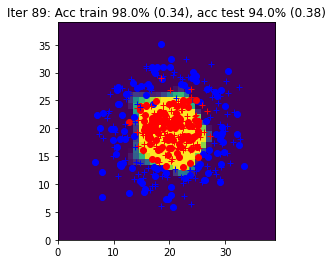

Iter 90: Acc train 98.0% (0.35), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


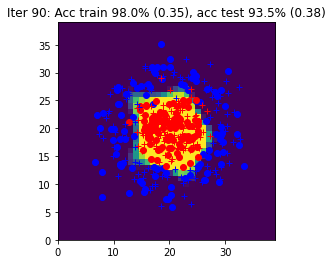

Iter 91: Acc train 98.0% (0.35), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


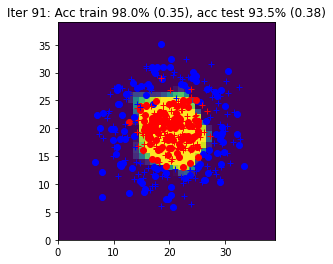

Iter 92: Acc train 98.0% (0.34), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


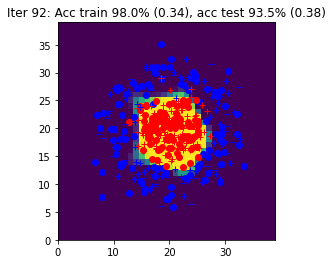

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 93: Acc train 97.5% (0.35), acc test 94.0% (0.37)


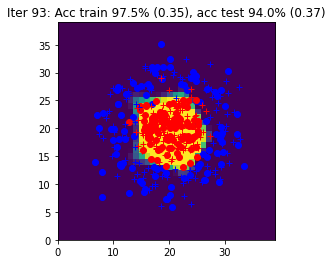

Iter 94: Acc train 98.0% (0.35), acc test 93.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


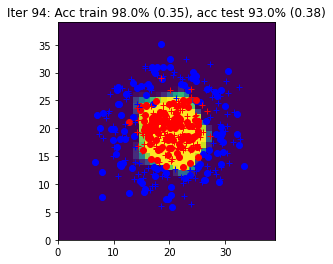

Iter 95: Acc train 98.0% (0.34), acc test 93.5% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


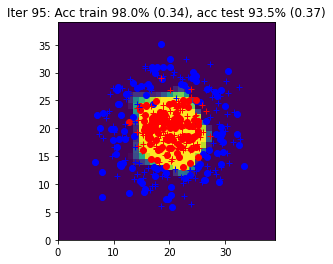

Iter 96: Acc train 98.0% (0.34), acc test 93.5% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


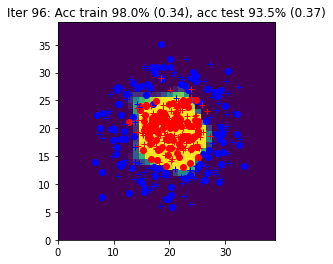

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 97: Acc train 98.0% (0.34), acc test 93.5% (0.38)


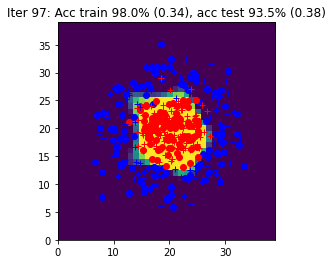

Iter 98: Acc train 98.0% (0.34), acc test 93.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


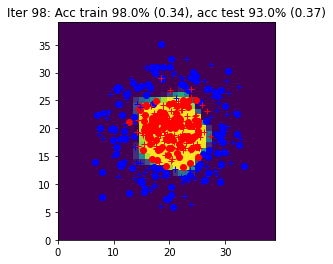

Iter 99: Acc train 98.0% (0.34), acc test 93.5% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


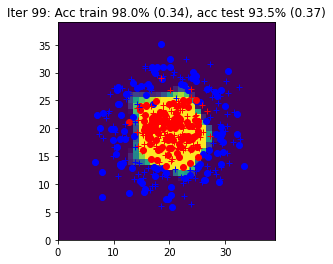

Iter 100: Acc train 96.5% (0.35), acc test 93.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


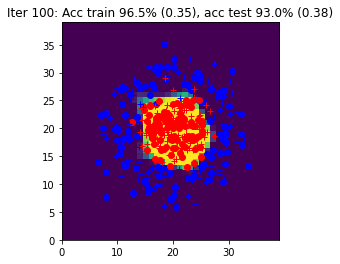

Iter 101: Acc train 98.0% (0.34), acc test 94.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


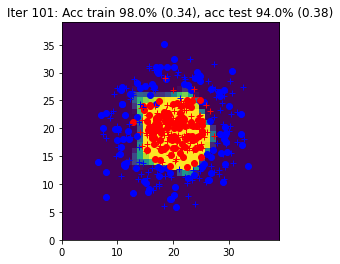

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 102: Acc train 98.0% (0.34), acc test 93.5% (0.37)


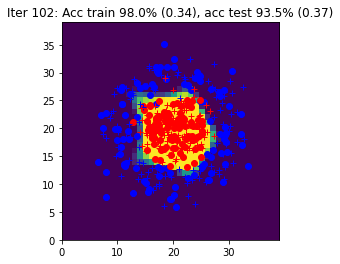

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 103: Acc train 98.0% (0.35), acc test 93.5% (0.37)


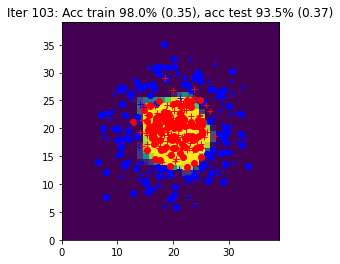

Iter 104: Acc train 98.0% (0.35), acc test 93.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


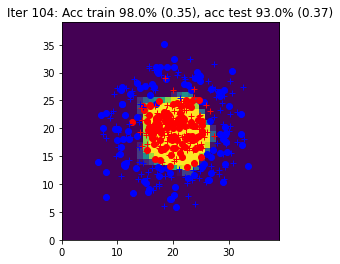

Iter 105: Acc train 98.0% (0.34), acc test 94.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


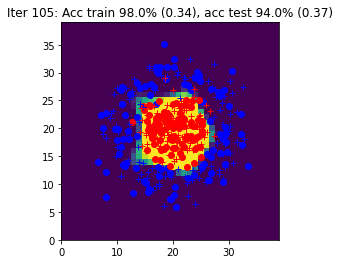

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 106: Acc train 98.0% (0.34), acc test 93.5% (0.37)


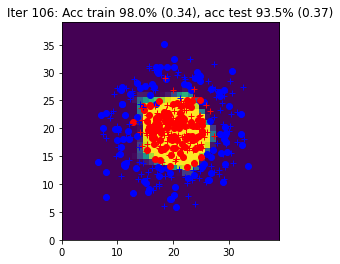

Iter 107: Acc train 98.0% (0.34), acc test 93.5% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


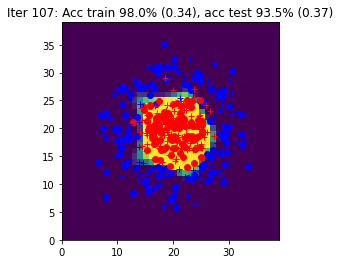

Iter 108: Acc train 98.0% (0.34), acc test 93.5% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


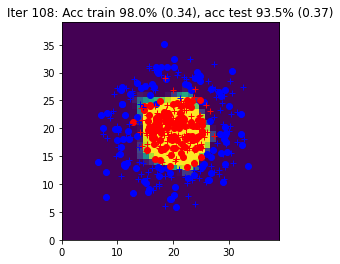

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 109: Acc train 98.0% (0.34), acc test 93.5% (0.37)


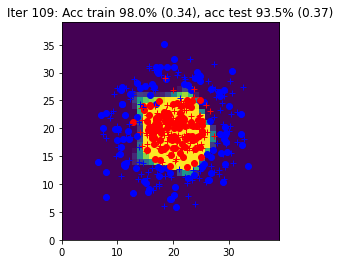

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 110: Acc train 98.0% (0.34), acc test 93.5% (0.38)


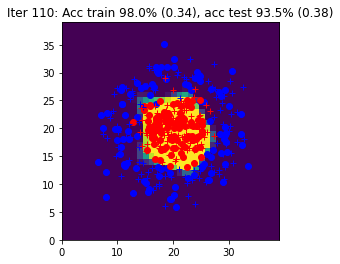

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 111: Acc train 98.0% (0.34), acc test 94.0% (0.37)


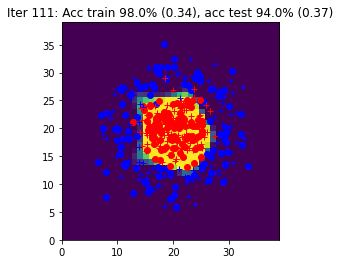

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 112: Acc train 98.0% (0.34), acc test 93.5% (0.37)


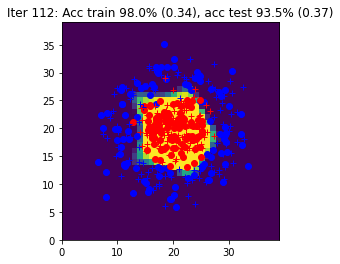

Iter 113: Acc train 98.0% (0.34), acc test 93.5% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


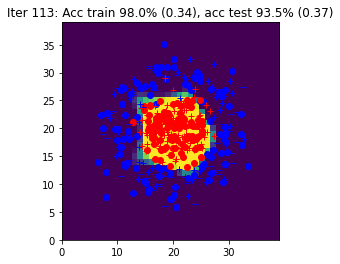

Iter 114: Acc train 98.0% (0.34), acc test 94.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


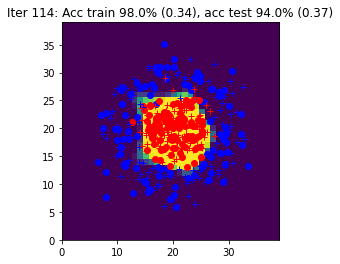

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 115: Acc train 98.0% (0.34), acc test 93.5% (0.37)


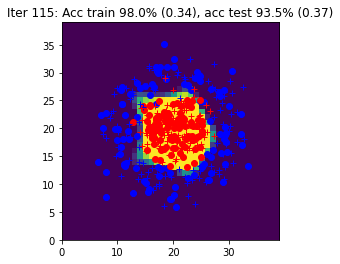

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 116: Acc train 98.0% (0.35), acc test 93.5% (0.38)


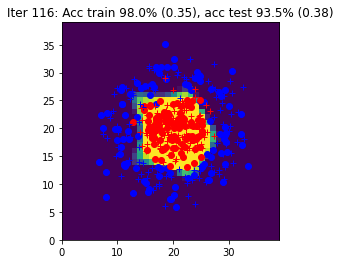

Iter 117: Acc train 97.5% (0.34), acc test 94.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


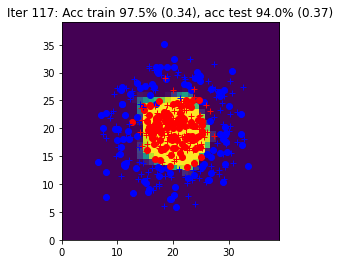

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 118: Acc train 98.0% (0.34), acc test 93.5% (0.37)


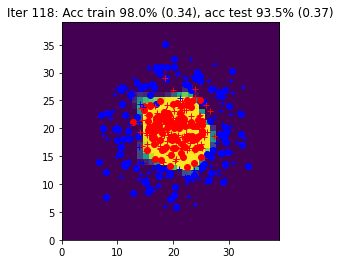

Iter 119: Acc train 98.0% (0.34), acc test 94.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


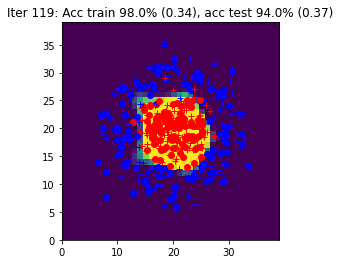

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 120: Acc train 98.0% (0.34), acc test 93.5% (0.38)


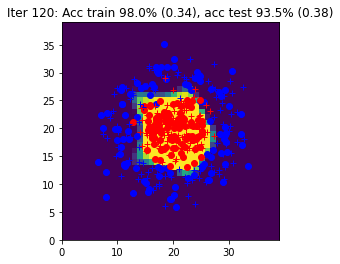

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 121: Acc train 98.0% (0.34), acc test 93.0% (0.37)


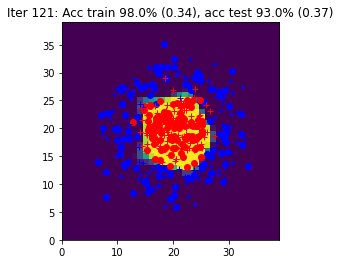

Iter 122: Acc train 98.0% (0.34), acc test 94.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


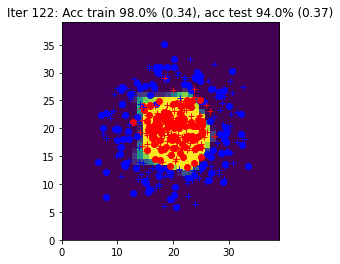

Iter 123: Acc train 98.0% (0.34), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


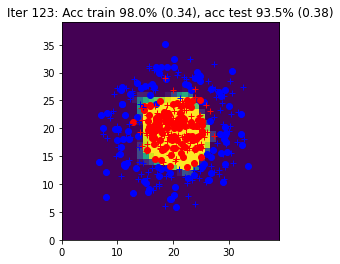

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 124: Acc train 98.0% (0.34), acc test 93.5% (0.37)


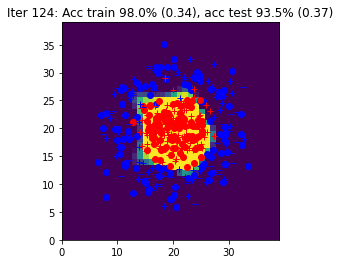

Iter 125: Acc train 98.0% (0.34), acc test 94.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


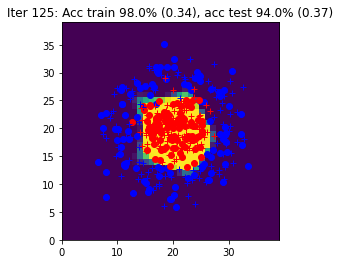

Iter 126: Acc train 98.0% (0.34), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


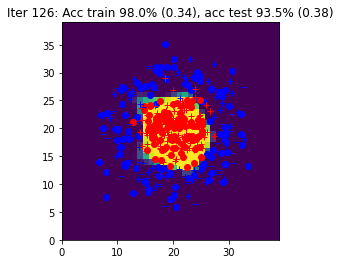

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 127: Acc train 98.0% (0.34), acc test 94.0% (0.37)


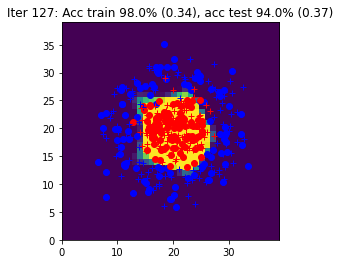

Iter 128: Acc train 98.0% (0.34), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


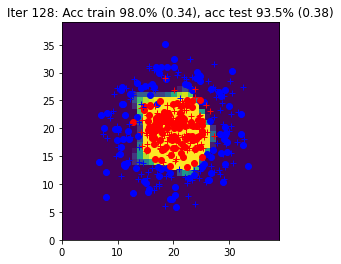

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 129: Acc train 98.0% (0.34), acc test 93.0% (0.38)


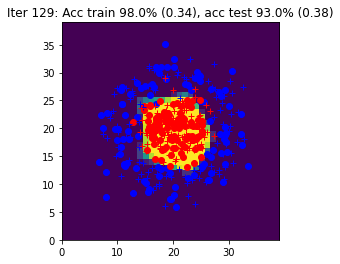

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 130: Acc train 97.5% (0.35), acc test 93.5% (0.38)


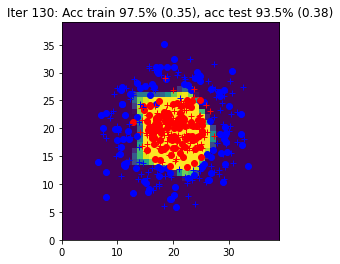

Iter 131: Acc train 98.0% (0.34), acc test 93.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


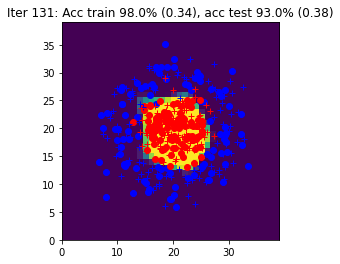

Iter 132: Acc train 98.0% (0.34), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


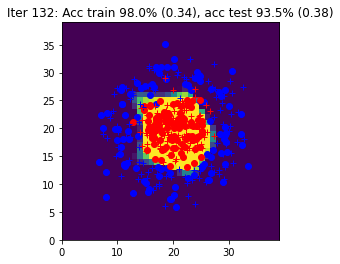

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 133: Acc train 98.0% (0.34), acc test 94.0% (0.38)


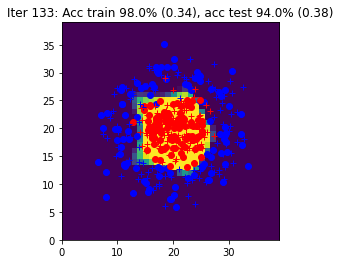

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 134: Acc train 98.0% (0.34), acc test 93.0% (0.38)


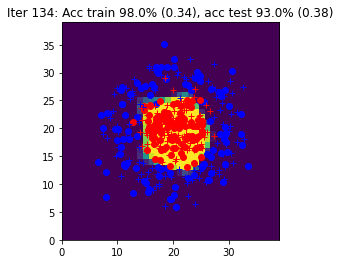

Iter 135: Acc train 98.0% (0.34), acc test 94.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


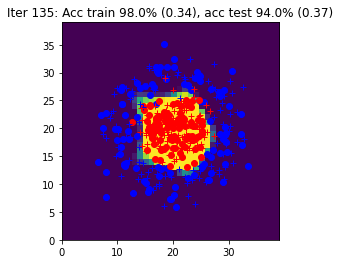

Iter 136: Acc train 98.0% (0.34), acc test 93.5% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


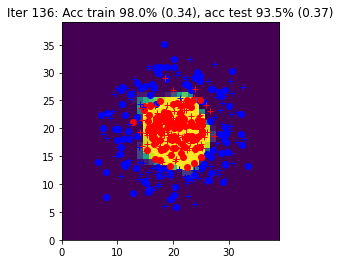

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 137: Acc train 98.0% (0.34), acc test 93.5% (0.38)


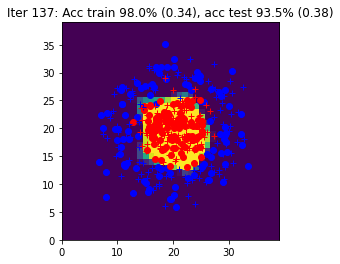

Iter 138: Acc train 97.5% (0.34), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


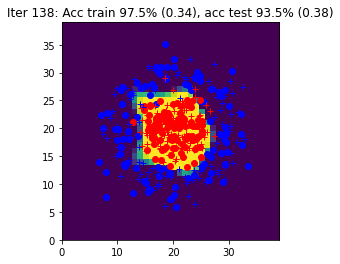

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 139: Acc train 98.0% (0.34), acc test 92.5% (0.38)


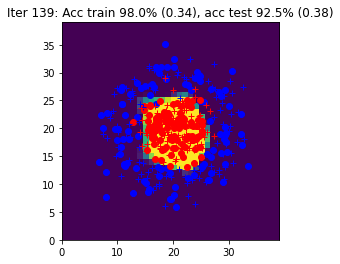

Iter 140: Acc train 98.0% (0.34), acc test 94.0% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


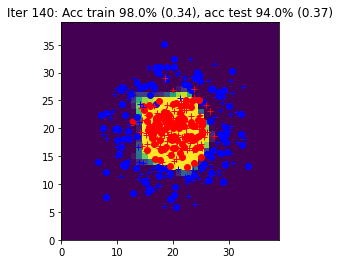

Iter 141: Acc train 98.0% (0.34), acc test 93.5% (0.37)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


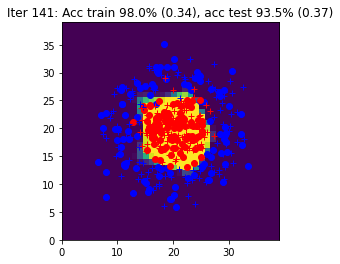

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 142: Acc train 98.0% (0.34), acc test 94.0% (0.38)


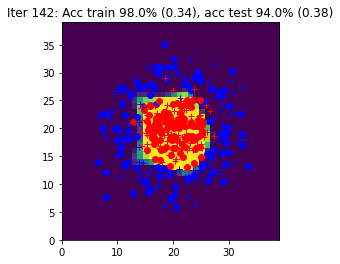

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 143: Acc train 98.0% (0.34), acc test 94.0% (0.37)


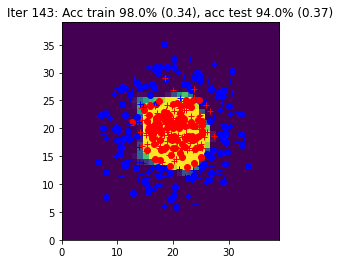

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 144: Acc train 98.0% (0.34), acc test 93.5% (0.38)


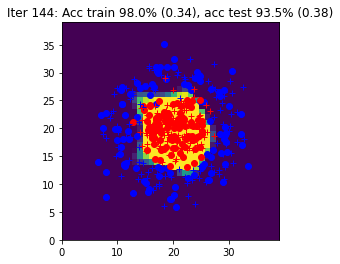

Iter 145: Acc train 97.5% (0.34), acc test 93.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


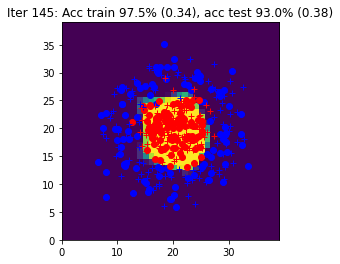

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 146: Acc train 97.5% (0.34), acc test 93.5% (0.38)


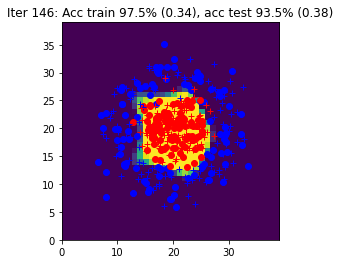

Iter 147: Acc train 98.0% (0.34), acc test 93.0% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


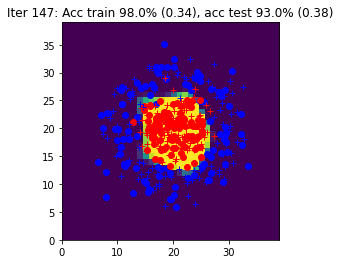

Iter 148: Acc train 98.0% (0.34), acc test 93.5% (0.38)


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


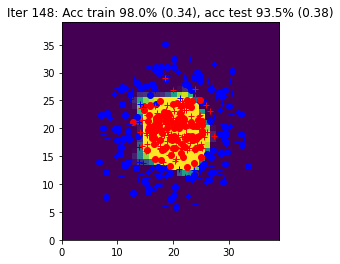

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 149: Acc train 98.0% (0.34), acc test 94.0% (0.37)


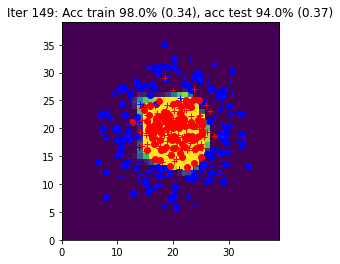

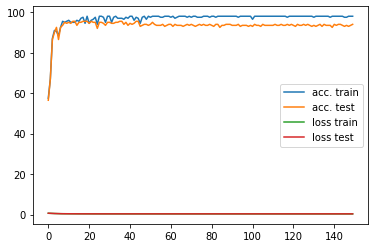

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

model, loss, optim = init_model(nx, nh, ny, eta)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Votre code ici  ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]
  
        # écrire l'algorithme d'apprentissage sur le batch (X,Y)
        # en utilisant la fonction loss_accuracy
        # effectuer le forward en faisant un appel au modèle 
        # calculer les gradients avec la fonction backward de l'autograd 
        # Puis une "step" d'optimisation
        Yhat = model.forward(X)
        #print(Y)
        model_loss, _ = loss_accuracy(loss,Yhat,Y)
        model_loss.backward()
        optim.step()
        optim.zero_grad()

    ####################
    ##      FIN        #
    ####################


    Yhat_train = model(data.Xtrain)
    Yhat_test = model(data.Xtest)
    Ltrain, acctrain = loss_accuracy(loss, Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)
    Ygrid = model(data.Xgrid)  

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title) 
    data.plot_data_with_grid(torch.nn.Softmax(dim=1)(Ygrid.detach()), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Partie 5 : MNIST

In [ ]:
# init
data = MNISTData()
N = data.Xtrain.shape[0]
Nbatch = 100
nx = data.Xtrain.shape[1]
nh = 100
ny = data.Ytrain.shape[1]
eta = 0.005

model, loss, optim = init_model(nx, nh, ny, eta)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Votre code ici  ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]
  
        # écrire l'algorithme d'apprentissage sur le batch (X,Y)
        # en utilisant la fonction loss_accuracy
        # effectuer le forward en faisant un appel au modèle 
        # calculer les gradients avec la fonction backward de l'autograd 
        # Puis une "step" d'optimisation
        Yhat = model.forward(X)
        #print(Y)
        model_loss, _ = loss_accuracy(loss,Yhat,Y)
        model_loss.backward()
        optim.step()
        optim.zero_grad()

    ####################
    ##      FIN        #
    ####################


    Yhat_train = model(data.Xtrain)
    Yhat_test = model(data.Xtest)
    Ltrain, acctrain = loss_accuracy(loss, Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)
    #Ygrid = model(data.Xgrid)  

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title) 
    #data.plot_data_with_grid(torch.nn.Softmax(dim=1)(Ygrid.detach()), title)

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 0: Acc train 74.3% (1.75), acc test 74.6% (1.74)
Iter 1: Acc train 74.2% (1.74), acc test 75.1% (1.73)
Iter 2: Acc train 73.1% (1.75), acc test 73.6% (1.75)
Iter 3: Acc train 75.1% (1.72), acc test 75.6% (1.71)
Iter 4: Acc train 74.0% (1.73), acc test 74.2% (1.73)
Iter 5: Acc train 76.0% (1.71), acc test 76.0% (1.71)
Iter 6: Acc train 76.9% (1.69), acc test 77.1% (1.69)
Iter 7: Acc train 77.1% (1.69), acc test 77.2% (1.69)
Iter 8: Acc train 77.7% (1.69), acc test 77.9% (1.68)
Iter 9: Acc train 78.3% (1.68), acc test 78.6% (1.68)
Iter 10: Acc train 76.9% (1.70), acc test 77.4% (1.69)
Iter 11: Acc train 75.0% (1.71), acc test 75.9% (1.71)
Iter 12: Acc train 76.2% (1.70), acc test 76.4% (1.70)
Iter 13: Acc train 77.0% (1.70), acc test 77.7% (1.69)
Iter 14: Acc train 75.5% (1.71), acc test 75.8% (1.71)
Iter 15: Acc train 77.9% (1.68), acc test 78.4% (1.68)
Iter 16: Acc train 74.9% (1.72), acc test 75.2% (1.71)
Iter 17: Acc train 81.0% (1.65), acc test 81.6% (1.65)
Iter 18: Acc train 8

# Partie 6: Bonus: SVM

In [ ]:
# data
data = CirclesData()
Xtrain = data.Xtrain.numpy()
Ytrain = data.Ytrain[:, 0].numpy()

Xgrid = data.Xgrid.numpy()

Xtest = data.Xtest.numpy()
Ytest = data.Ytest[:, 0].numpy()

def plot_svm_predictions(data, predictions):
      plt.figure(2)
      plt.clf()
      plt.imshow(np.reshape(predictions, (40,40)))
      plt.plot(data._Xtrain[data._Ytrain[:,0] == 1,0]*10+20, data._Xtrain[data._Ytrain[:,0] == 1,1]*10+20, 'bo', label="Train")
      plt.plot(data._Xtrain[data._Ytrain[:,1] == 1,0]*10+20, data._Xtrain[data._Ytrain[:,1] == 1,1]*10+20, 'ro')
      plt.plot(data._Xtest[data._Ytest[:,0] == 1,0]*10+20, data._Xtest[data._Ytest[:,0] == 1,1]*10+20, 'b+', label="Test")
      plt.plot(data._Xtest[data._Ytest[:,1] == 1,0]*10+20, data._Xtest[data._Ytest[:,1] == 1,1]*10+20, 'r+')
      plt.xlim(0,39)
      plt.ylim(0,39)
      plt.clim(0.3,0.7)
      plt.draw()
      plt.pause(1e-3)

In [ ]:
import sklearn.svm

############################
### Votre code ici   #######
### Entrainer le SVM #######
## Voir https://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVC.html
## et https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html
############################

svm = sklearn.svm.LinearSVC()
svm.fit(Xtrain,Ytrain)

###########################

LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=1000,
          multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
          verbose=0)

Accuracy : 53.00


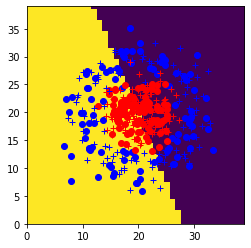

In [ ]:
## Affichage des résultats

Ytest_pred = svm.predict(Xtest)
accuracy = np.sum(Ytest == Ytest_pred) / len(Ytest)
print(f"Accuracy : {100 * accuracy:.2f}")
Ygrid_pred = svm.predict(Xgrid)
plot_svm_predictions(data, Ygrid_pred)

Accuracy : 62.00


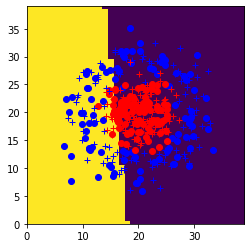

In [ ]:
svm = sklearn.svm.SVC(kernel='linear')
svm.fit(Xtrain,Ytrain)
## Affichage des résultats

Ytest_pred = svm.predict(Xtest)
accuracy = np.sum(Ytest == Ytest_pred) / len(Ytest)
print(f"Accuracy : {100 * accuracy:.2f}")
Ygrid_pred = svm.predict(Xgrid)
plot_svm_predictions(data, Ygrid_pred)

Accuracy : 94.00


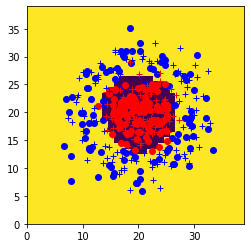

In [ ]:
svm = sklearn.svm.SVC(kernel='rbf')
svm.fit(Xtrain,Ytrain)
## Affichage des résultats

Ytest_pred = svm.predict(Xtest)
accuracy = np.sum(Ytest == Ytest_pred) / len(Ytest)
print(f"Accuracy : {100 * accuracy:.2f}")
Ygrid_pred = svm.predict(Xgrid)
plot_svm_predictions(data, Ygrid_pred)

Accuracy : 54.50


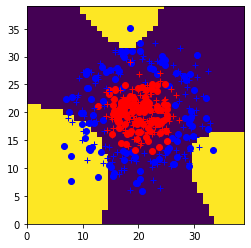

In [ ]:
svm = sklearn.svm.SVC(kernel='poly')
svm.fit(Xtrain,Ytrain)
## Affichage des résultats

Ytest_pred = svm.predict(Xtest)
accuracy = np.sum(Ytest == Ytest_pred) / len(Ytest)
print(f"Accuracy : {100 * accuracy:.2f}")
Ygrid_pred = svm.predict(Xgrid)
plot_svm_predictions(data, Ygrid_pred)

Accuracy : 65.00


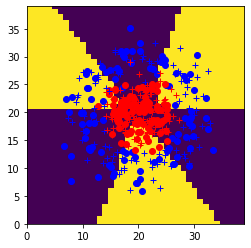

In [ ]:
svm = sklearn.svm.SVC(kernel='sigmoid',C=1)
svm.fit(Xtrain,Ytrain)
## Affichage des résultats

Ytest_pred = svm.predict(Xtest)
accuracy = np.sum(Ytest == Ytest_pred) / len(Ytest)
print(f"Accuracy : {100 * accuracy:.2f}")
Ygrid_pred = svm.predict(Xgrid)
plot_svm_predictions(data, Ygrid_pred)